In [1]:
pip install patool pyunpack


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.3/86.3 kB 7.2 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')
from pyunpack import Archive

Mounted at /content/drive


In [3]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 45.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [4]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
import shutil


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
os.mkdir('car')

In [ ]:
Archive('/content/drive/MyDrive/Вуз /lab/car.rar').extractall('/content/car')

In [7]:
shutil.copyfile('/content/car/data.yaml', '/content/car/test.yaml')

'/content/car/test.yaml'

In [8]:
with open("/content/car/test.yaml", "w") as myfile:
    myfile.write("train: ../train/images\n")
    myfile.write("val: ../test/images\n")
    myfile.write("nc: 15\n")
    myfile.write("names: ['Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100', 'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30', 'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70', 'Speed Limit 80', 'Speed Limit 90', 'Stop']")

#### Описание датасета
- Всего в датасете 15 классов
- Каждый класс отвечает за какой-то дорожный знак
- Датасет разделен на обучающую, валидационную и тестовую выборки примерно в соотношении 70%/15%/15%

#### Обучаем предобученные модель

#### yolov8n.pt

In [9]:
device = 'cuda'
model = YOLO('yolov8n.pt').to(device)

# Training The Final Model
Result_Final_model = model.train(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'),epochs = 30,  )

100%|██████████| 6.25M/6.25M [00:00<00:00, 355MB/s]


engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/car/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, sim

100%|██████████| 755k/755k [00:00<00:00, 102MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 339MB/s]


AMP: checks passed ✅


train: Scanning /content/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:01<00:00, 2199.39it/s]


train: New cache created: /content/car/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<00:00, 925.01it/s]

val: New cache created: /content/car/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.18G     0.8439      3.467      1.197         33        640: 100%|██████████| 221/221 [01:08<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.86it/s]

                   all        801        944      0.233      0.404      0.255      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.67G     0.7648      2.547      1.104         25        640: 100%|██████████| 221/221 [01:02<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.19it/s]

                   all        801        944      0.328      0.537      0.379      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.68G     0.7418      2.136      1.078         22        640: 100%|██████████| 221/221 [01:00<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.26it/s]

                   all        801        944      0.399      0.616      0.505       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.7G     0.7289      1.847      1.067         27        640: 100%|██████████| 221/221 [01:01<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.51it/s]


                   all        801        944      0.608      0.605      0.665      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.72G     0.7029      1.564      1.052         25        640: 100%|██████████| 221/221 [01:02<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.82it/s]


                   all        801        944      0.746      0.658      0.753      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.72G     0.6939      1.399      1.046         22        640: 100%|██████████| 221/221 [01:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.06it/s]

                   all        801        944      0.792      0.743      0.813      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.75G     0.6649      1.252       1.04         30        640: 100%|██████████| 221/221 [01:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.07it/s]

                   all        801        944      0.825      0.701      0.815      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.77G     0.6489      1.148      1.017         26        640: 100%|██████████| 221/221 [01:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.90it/s]

                   all        801        944      0.868      0.767      0.853      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.78G     0.6564      1.066      1.019         19        640: 100%|██████████| 221/221 [01:02<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.50it/s]

                   all        801        944      0.904      0.798      0.894      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.79G     0.6363      1.018      1.011         25        640: 100%|██████████| 221/221 [01:01<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.24it/s]

                   all        801        944      0.922      0.762      0.873      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.82G     0.6374     0.9783      1.013         17        640: 100%|██████████| 221/221 [01:01<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.22it/s]

                   all        801        944      0.924      0.819        0.9      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.83G     0.6189     0.9589      1.003         26        640: 100%|██████████| 221/221 [01:00<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.30it/s]

                   all        801        944      0.934      0.821      0.907      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.85G     0.6061     0.9006     0.9989         25        640: 100%|██████████| 221/221 [01:00<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.02it/s]

                   all        801        944      0.888      0.842      0.913      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.86G     0.6025      0.868     0.9948         19        640: 100%|██████████| 221/221 [01:01<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.11it/s]

                   all        801        944       0.92      0.853      0.924      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.89G     0.6028      0.847     0.9877         20        640: 100%|██████████| 221/221 [01:01<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.80it/s]

                   all        801        944      0.911      0.843      0.918      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       2.9G     0.5952      0.831     0.9833         24        640: 100%|██████████| 221/221 [00:59<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.30it/s]

                   all        801        944      0.922      0.857      0.921      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.92G     0.5977     0.8097     0.9895         16        640: 100%|██████████| 221/221 [00:59<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.45it/s]

                   all        801        944      0.919      0.862      0.929       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.93G     0.5743     0.7675     0.9789         13        640: 100%|██████████| 221/221 [00:59<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.99it/s]

                   all        801        944      0.941      0.856      0.933      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.95G     0.5768     0.7502      0.981         19        640: 100%|██████████| 221/221 [01:01<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.11it/s]

                   all        801        944      0.952       0.86      0.938      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.97G     0.5655     0.7297     0.9734         19        640: 100%|██████████| 221/221 [01:00<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.56it/s]

                   all        801        944      0.951      0.874      0.943      0.806


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.99G     0.5632     0.5432     0.9478         12        640: 100%|██████████| 221/221 [01:00<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.17it/s]

                   all        801        944      0.965      0.857      0.944      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30         3G     0.5547     0.4978      0.943         19        640: 100%|██████████| 221/221 [00:59<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.37it/s]

                   all        801        944      0.928      0.881      0.945      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      3.03G     0.5459     0.4749     0.9395         11        640: 100%|██████████| 221/221 [00:58<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.15it/s]

                   all        801        944      0.949       0.89      0.953      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.04G     0.5353     0.4577     0.9291         10        640: 100%|██████████| 221/221 [00:57<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.35it/s]

                   all        801        944      0.969      0.867      0.951      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.06G     0.5338     0.4367     0.9265         12        640: 100%|██████████| 221/221 [00:56<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.13it/s]

                   all        801        944      0.931      0.908      0.953      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.06G     0.5225     0.4281     0.9211         10        640: 100%|██████████| 221/221 [00:57<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.59it/s]

                   all        801        944      0.943      0.903      0.957      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       3.1G     0.5226     0.4188     0.9163         15        640: 100%|██████████| 221/221 [00:56<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.90it/s]


                   all        801        944      0.955      0.898      0.957      0.824

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.11G     0.5103     0.4042     0.9139         10        640: 100%|██████████| 221/221 [00:56<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.61it/s]

                   all        801        944       0.95      0.894       0.96      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.13G     0.5063     0.3942      0.915         12        640: 100%|██████████| 221/221 [00:56<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.78it/s]

                   all        801        944      0.946      0.908       0.96      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.14G     0.5002     0.3859     0.9105         13        640: 100%|██████████| 221/221 [00:56<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.66it/s]

                   all        801        944       0.95      0.897      0.961       0.83



30 epochs completed in 0.569 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.53it/s]


                   all        801        944      0.963      0.888      0.961       0.83
           Green Light         87        122      0.898      0.649      0.864      0.505
             Red Light         74        108        0.9      0.664      0.803      0.509
       Speed Limit 100         52         52       0.97      0.942      0.985      0.885
       Speed Limit 110         17         17      0.887          1      0.992      0.901
       Speed Limit 120         60         60          1       0.91      0.994      0.911
        Speed Limit 20         56         56      0.992      0.982      0.986      0.864
        Speed Limit 30         71         74      0.986      0.959      0.988      0.929
        Speed Limit 40         53         55      0.996      0.927      0.989      0.883
        Speed Limit 50         68         71      0.983      0.811      0.965      0.856
        Speed Limit 60         76         76      0.927      0.921      0.959      0.877
        Speed Limit 7

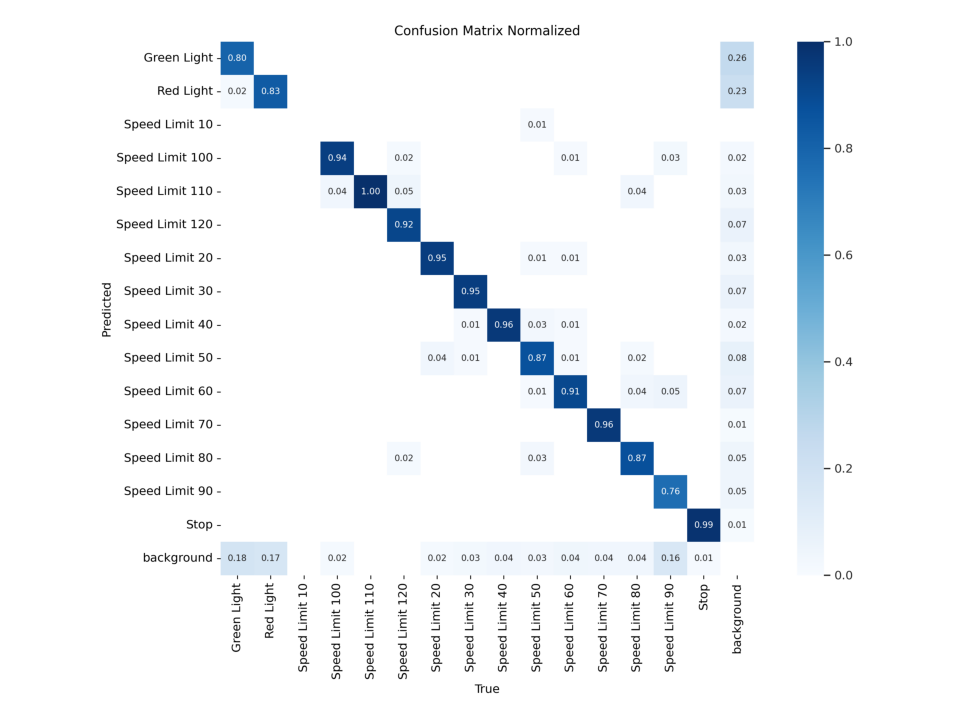

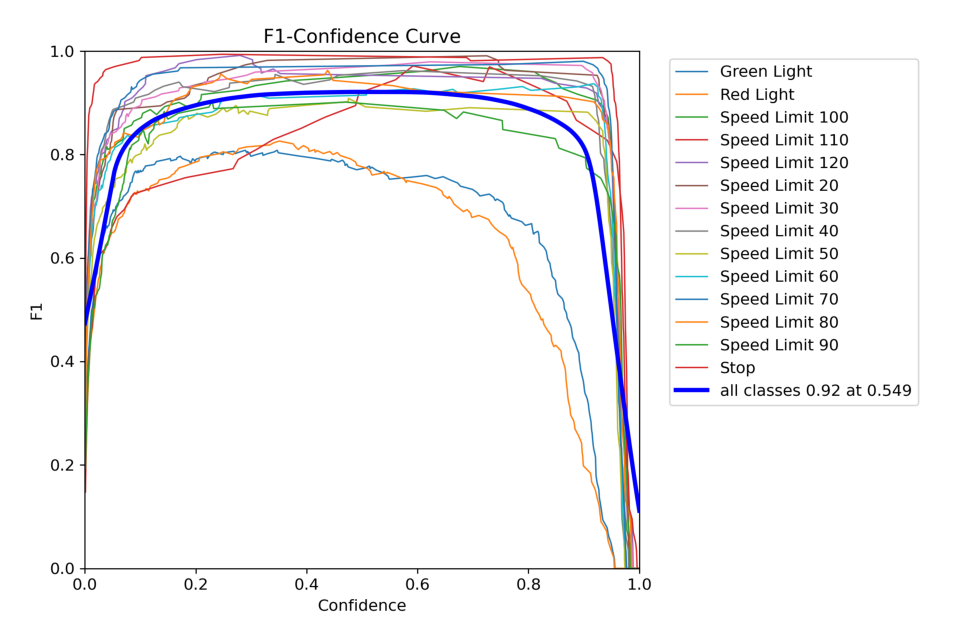

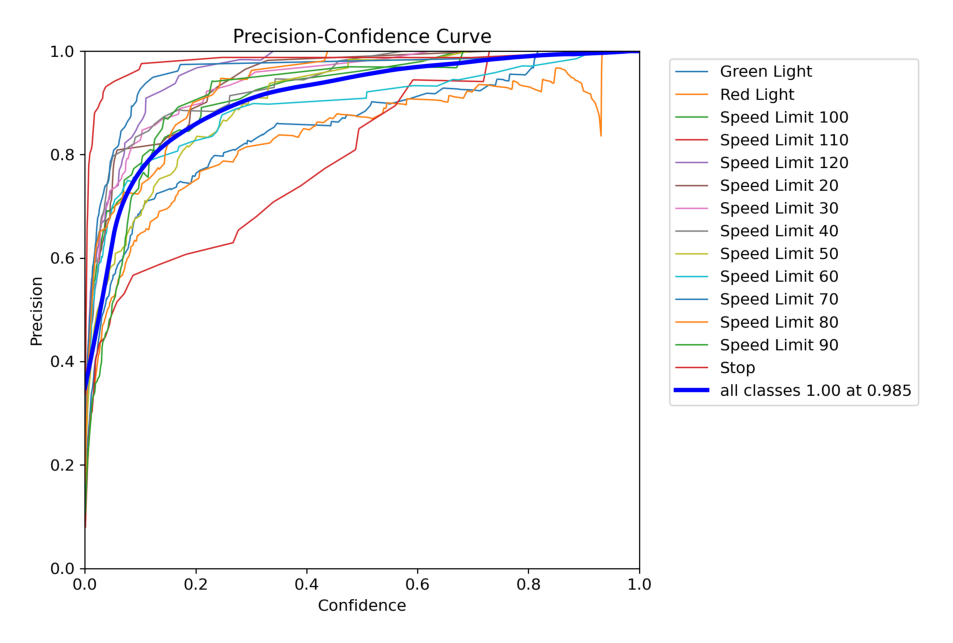

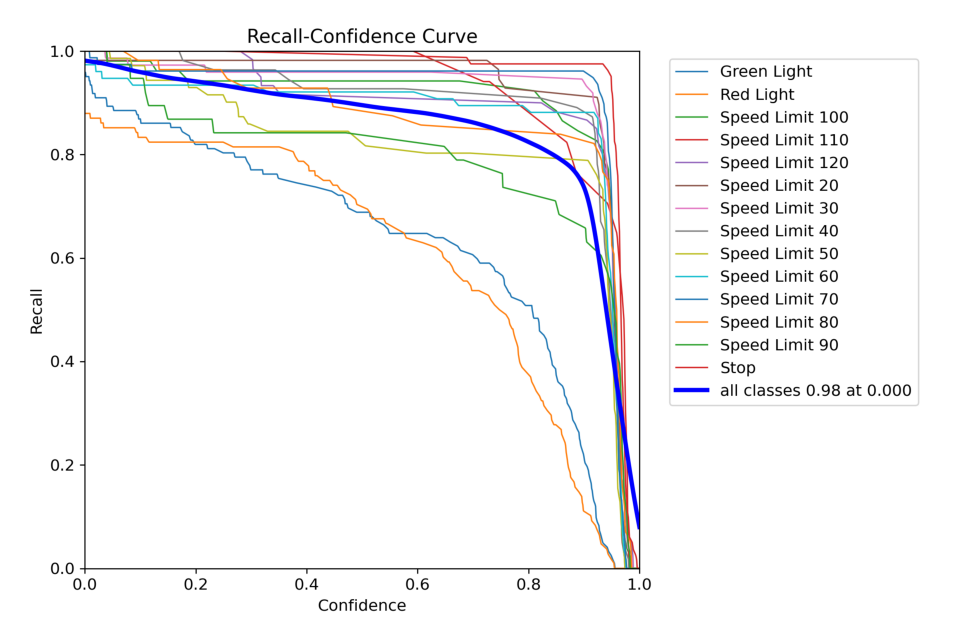

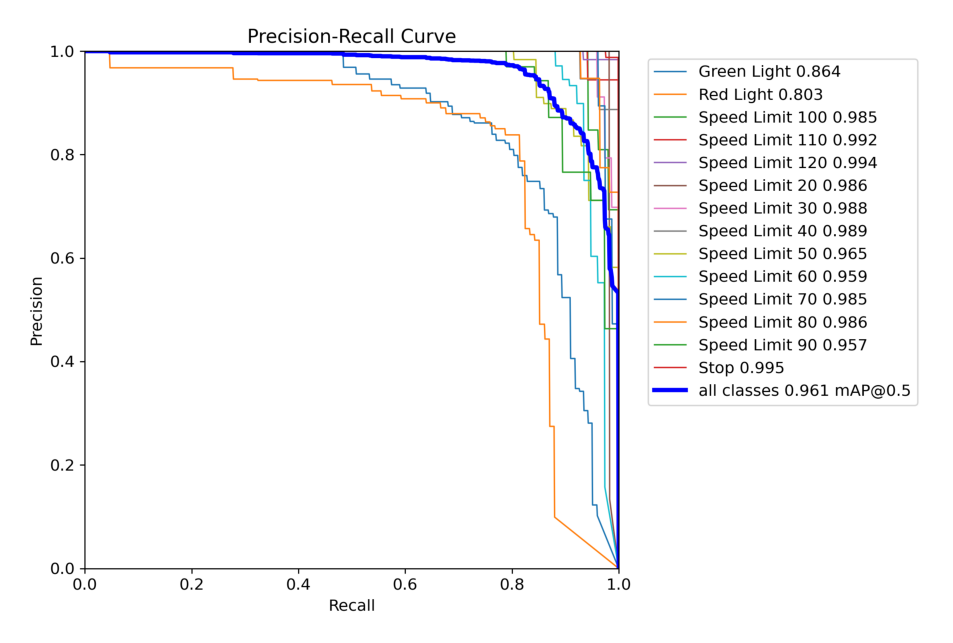

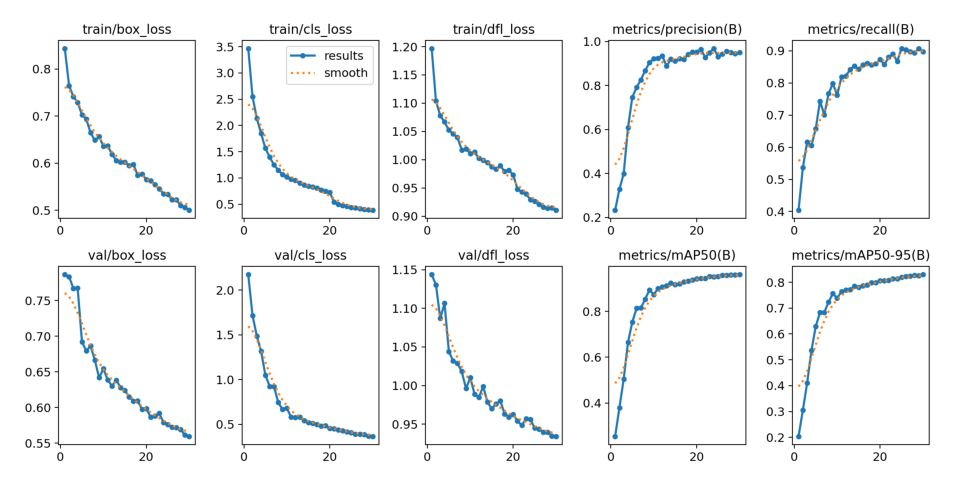

In [10]:
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = plt.imread(image_path)


        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()


image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]
post_training_files_path = '/content//runs/detect/train'

display_images(post_training_files_path, image_files)

In [11]:
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'))

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.91it/s]


                   all        801        944      0.951      0.899      0.961      0.832
           Green Light         87        122      0.885      0.693      0.867      0.505
             Red Light         74        108      0.887      0.729      0.812      0.509
       Speed Limit 100         52         52      0.959      0.942      0.985      0.886
       Speed Limit 110         17         17      0.805          1      0.992      0.902
       Speed Limit 120         60         60          1      0.912      0.994      0.912
        Speed Limit 20         56         56      0.989      0.982      0.986      0.865
        Speed Limit 30         71         74      0.978      0.959      0.988      0.929
        Speed Limit 40         53         55      0.985      0.927      0.989      0.881
        Speed Limit 50         68         71      0.984       0.84      0.966      0.857
        Speed Limit 60         76         76      0.907      0.921      0.959      0.877
        Speed Limit 7

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d6c8e7cc310>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.0

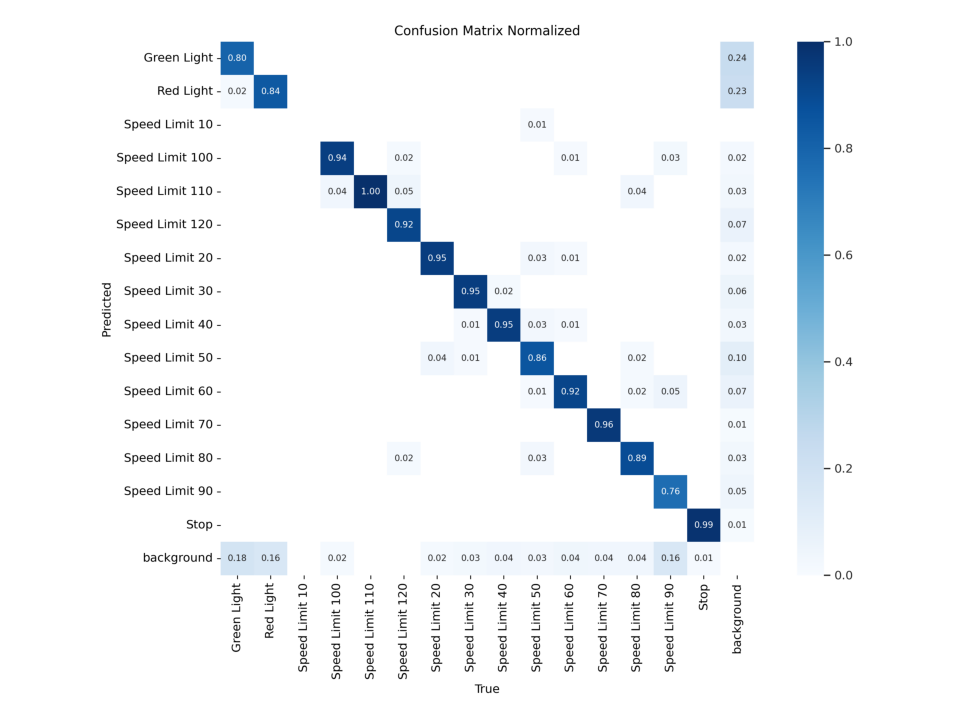

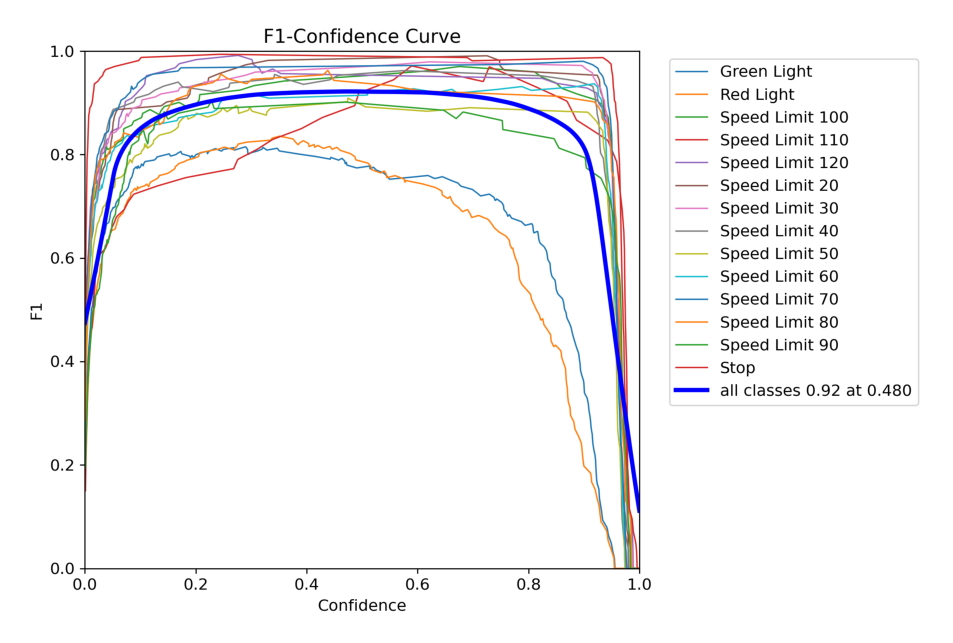

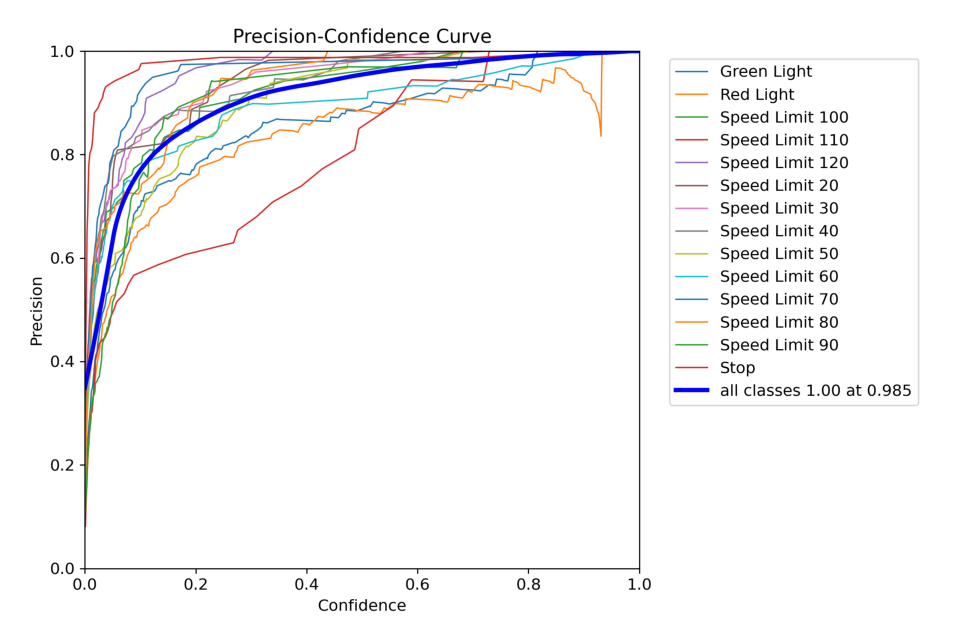

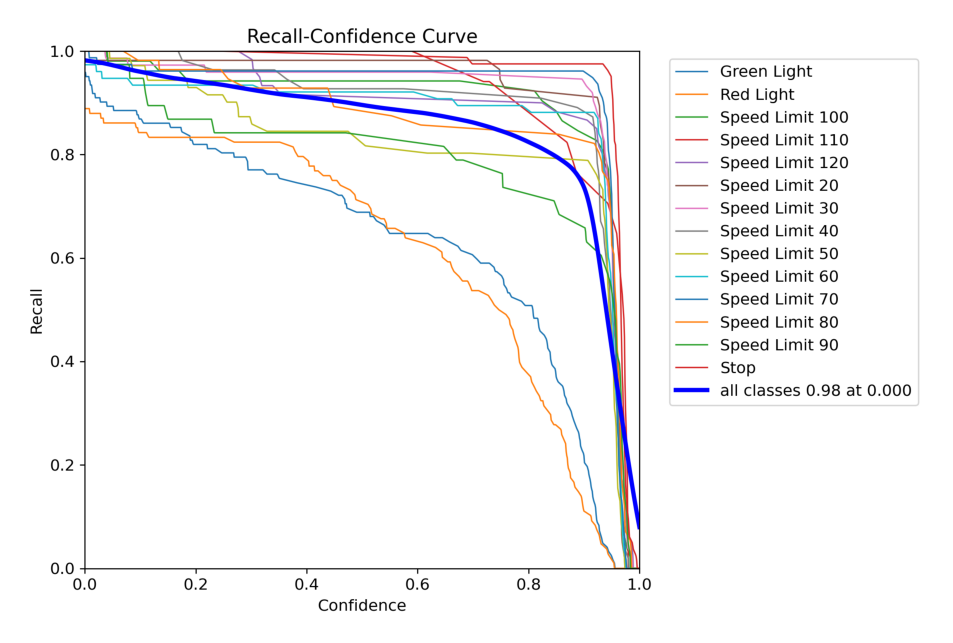

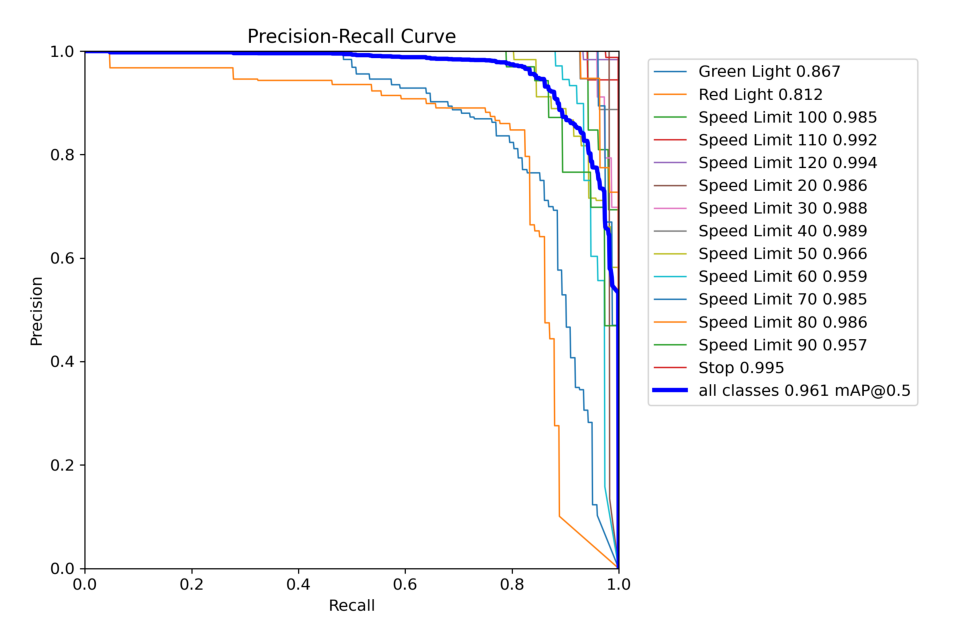

In [12]:


image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',

]
post_training_files_path = '/content//runs/detect/train2'

display_images(post_training_files_path, image_files)

In [13]:
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'test.yaml'))

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/car/test/labels... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<00:00, 2254.15it/s]

val: New cache created: /content/car/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.74it/s]


                   all        638        770      0.907      0.859      0.917      0.786
           Green Light         77        110      0.936        0.8      0.907       0.56
             Red Light         71         94      0.849      0.691       0.77      0.493
        Speed Limit 10          2          3      0.641      0.667      0.696      0.569
       Speed Limit 100         45         46      0.907      0.913      0.944      0.833
       Speed Limit 110         21         21      0.945       0.81      0.852      0.767
       Speed Limit 120         40         44      0.956      0.977      0.983      0.875
        Speed Limit 20         46         46      0.936      0.948      0.973      0.883
        Speed Limit 30         60         60       0.95      0.833      0.941      0.863
        Speed Limit 40         51         53      0.981      0.943      0.982      0.872
        Speed Limit 50         47         50      0.899       0.82      0.907      0.799
        Speed Limit 6

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d6c8e7a6f50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

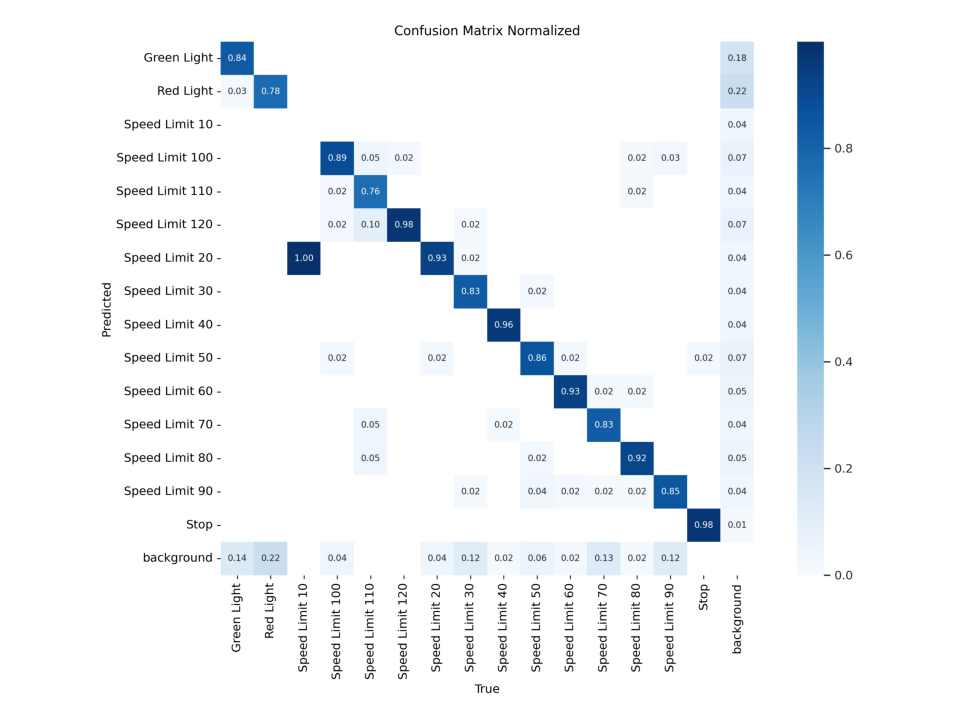

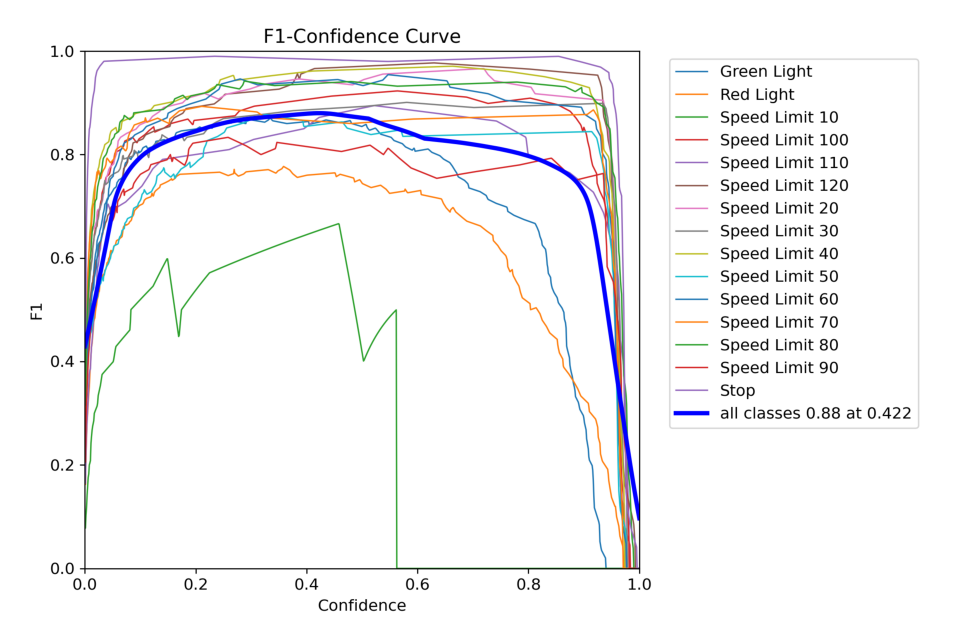

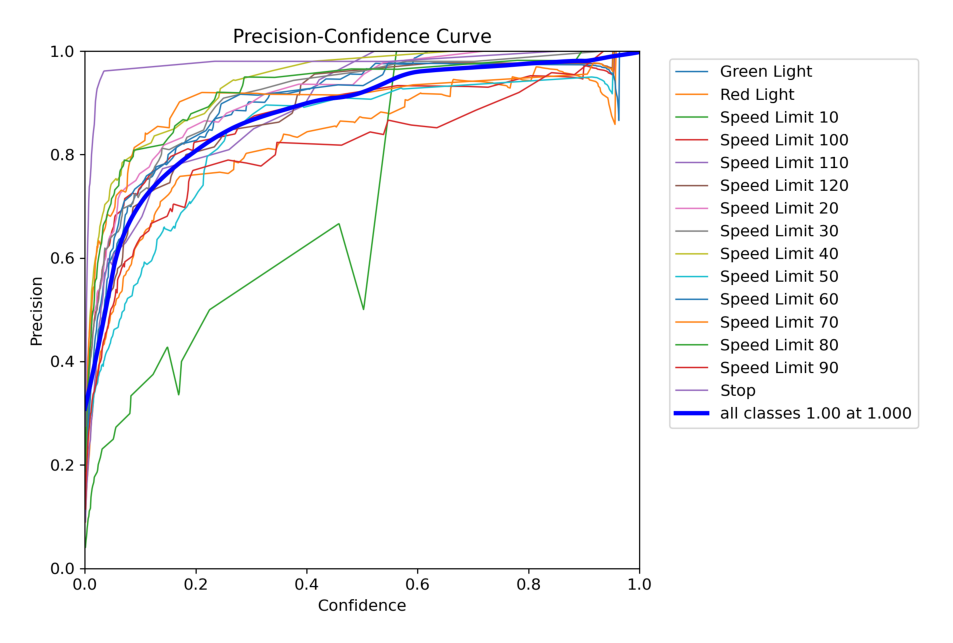

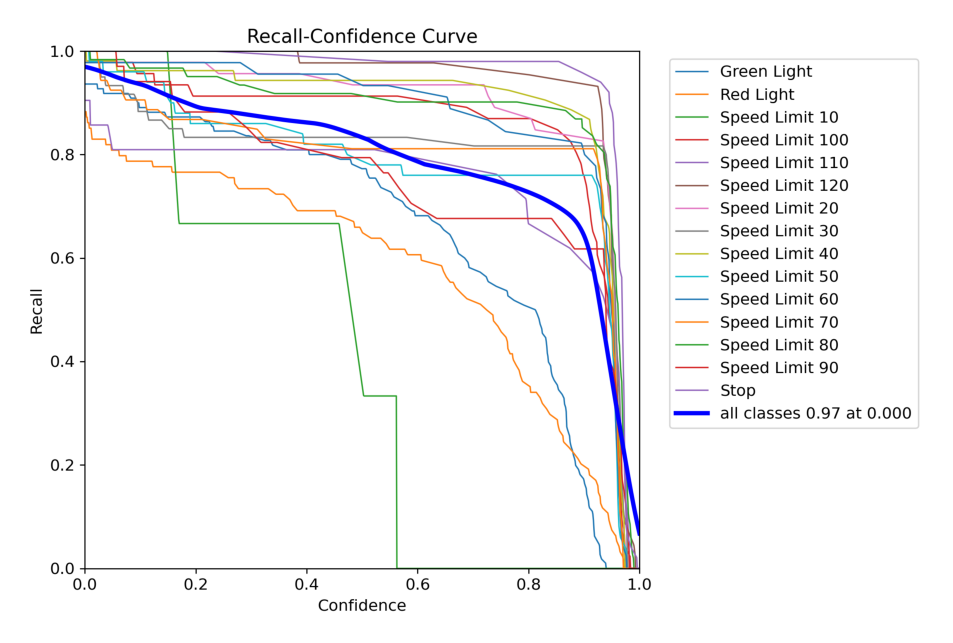

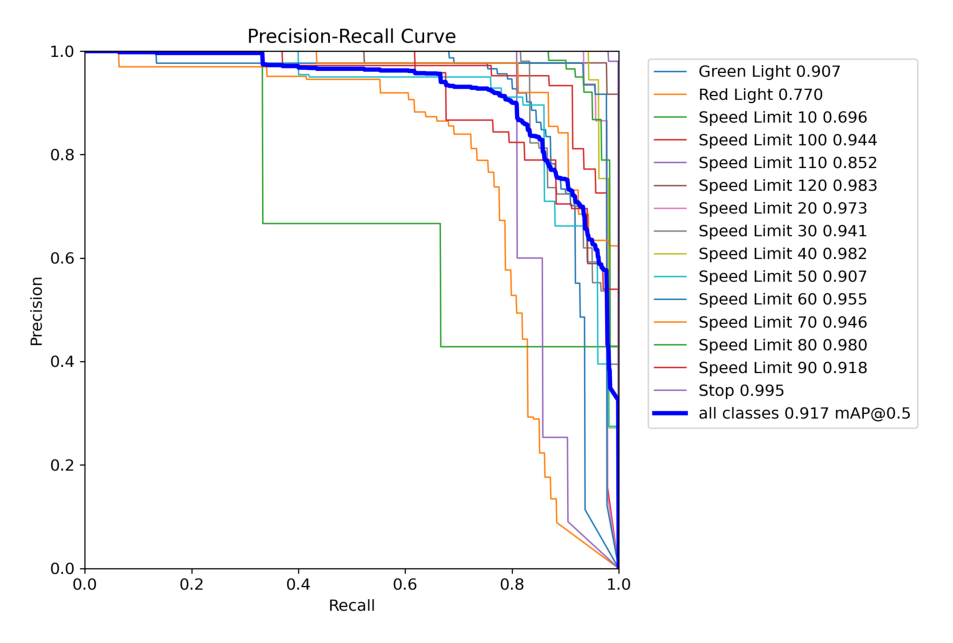

In [14]:
post_training_files_path = '/content//runs/detect/train3'

display_images(post_training_files_path, image_files)

#### Выводы
- Модель достигла достаточно высокого качества
- Переобучения не наблюдается
- Чаще всего модель путает знак Speed limit 10 с Speed limit 20 на тестовых данных
- Чаще всего на тестовых данных модель путает знак Red Light с задним фоном(0.2)

#### yolov9t.pt

In [15]:
device = 'cuda'
model = YOLO('yolov9t.pt').to(device)

# Training The Final Model
Result_Final_model = model.train(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'),epochs = 30,  )

100%|██████████| 4.74M/4.74M [00:00<00:00, 236MB/s]

engine/trainer: task=detect, mode=train, model=yolov9t.pt, data=/content/car/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, si

  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7872  ultralytics.nn.modules.block.ELAN1           [32, 32, 32, 16]              
  3                  -1  1     18560  ultralytics.nn.modules.block.AConv           [32, 64]                      
  4                  -1  1     65216  ultralytics.nn.modules.block.RepNCSPELAN4    [64, 64, 64, 32, 3]           
  5                  -1  1     55488  ultralytics.nn.modules.block.AConv           [64, 96]                      
  6                  -1  1    145824  ultralytics.nn.modules.block.RepNCSPELAN4    [96, 96, 96, 48, 3]           
  7                  -1  1    110848  ultralytics.nn.modules.block.AConv           [96, 128]                     
  8                  -1  1    258432  ultralytics.nn.modules.block.RepNCSPELAN4    [128,

train: Scanning /content/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 221 weight(decay=0.0), 228 weight(decay=0.0005), 227 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.75G      0.852      3.536       1.21         33        640: 100%|██████████| 221/221 [01:33<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.93it/s]

                   all        801        944      0.214      0.537      0.246        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.91G     0.7638      2.548      1.112         25        640: 100%|██████████| 221/221 [01:24<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.39it/s]

                   all        801        944      0.247      0.501      0.316      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.91G     0.7481      2.128       1.09         22        640: 100%|██████████| 221/221 [01:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.63it/s]

                   all        801        944      0.371      0.567      0.431      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.91G     0.7249      1.873      1.079         27        640: 100%|██████████| 221/221 [01:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.09it/s]

                   all        801        944      0.528      0.595      0.571      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.91G     0.6985      1.614       1.06         25        640: 100%|██████████| 221/221 [01:24<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.39it/s]

                   all        801        944       0.57      0.646      0.646      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.91G     0.6965      1.441      1.056         22        640: 100%|██████████| 221/221 [01:23<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.32it/s]


                   all        801        944      0.759      0.702      0.771      0.653

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.91G     0.6601      1.271      1.043         30        640: 100%|██████████| 221/221 [01:28<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.02it/s]

                   all        801        944      0.795      0.729      0.806      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.91G     0.6498      1.154      1.027         26        640: 100%|██████████| 221/221 [01:27<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.79it/s]

                   all        801        944      0.793      0.731       0.82      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.91G     0.6483      1.086      1.024         19        640: 100%|██████████| 221/221 [01:25<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.29it/s]

                   all        801        944      0.879       0.74      0.845      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.91G      0.637      1.044      1.019         25        640: 100%|██████████| 221/221 [01:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.93it/s]

                   all        801        944      0.885      0.786      0.874      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.91G     0.6369     0.9786      1.023         17        640: 100%|██████████| 221/221 [01:29<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.02it/s]

                   all        801        944      0.889      0.777      0.867      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.91G     0.6242     0.9601      1.015         26        640: 100%|██████████| 221/221 [01:23<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.40it/s]

                   all        801        944      0.923      0.824        0.9      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.91G     0.6095     0.9042       1.01         25        640: 100%|██████████| 221/221 [01:23<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.08it/s]

                   all        801        944      0.905      0.789       0.88      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.91G     0.6023     0.8901          1         19        640: 100%|██████████| 221/221 [01:23<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]

                   all        801        944       0.92      0.816      0.902      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.91G     0.6017     0.8518     0.9973         20        640: 100%|██████████| 221/221 [01:24<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.95it/s]


                   all        801        944      0.924      0.829      0.909      0.775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.91G     0.5966      0.835     0.9933         24        640: 100%|██████████| 221/221 [01:27<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.03it/s]

                   all        801        944      0.933      0.828      0.911      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.91G     0.5954     0.7974     0.9958         16        640: 100%|██████████| 221/221 [01:25<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.36it/s]

                   all        801        944      0.947      0.831      0.917      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.91G     0.5734     0.7649     0.9898         13        640: 100%|██████████| 221/221 [01:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.40it/s]

                   all        801        944      0.954      0.831      0.924      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.91G     0.5806     0.7488     0.9903         19        640: 100%|██████████| 221/221 [01:25<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.65it/s]

                   all        801        944      0.944      0.835      0.924      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.91G     0.5681     0.7181     0.9825         19        640: 100%|██████████| 221/221 [01:29<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.72it/s]

                   all        801        944      0.927      0.866       0.93      0.798


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.91G     0.5659     0.5208     0.9555         12        640: 100%|██████████| 221/221 [01:24<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.24it/s]

                   all        801        944      0.916      0.863      0.935      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.91G     0.5498     0.4791     0.9447         19        640: 100%|██████████| 221/221 [01:24<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.08it/s]

                   all        801        944      0.945      0.847      0.931      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.91G     0.5437     0.4549     0.9476         11        640: 100%|██████████| 221/221 [01:20<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.32it/s]


                   all        801        944      0.953      0.849      0.936      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.91G     0.5357     0.4485     0.9383         10        640: 100%|██████████| 221/221 [01:18<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.38it/s]

                   all        801        944      0.941      0.878      0.946      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.91G     0.5351       0.43     0.9366         12        640: 100%|██████████| 221/221 [01:21<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.89it/s]

                   all        801        944      0.963       0.86      0.945      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.91G     0.5253     0.4094     0.9334         10        640: 100%|██████████| 221/221 [01:21<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.25it/s]

                   all        801        944       0.95      0.863      0.946      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.91G     0.5213     0.4103     0.9271         15        640: 100%|██████████| 221/221 [01:25<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.98it/s]

                   all        801        944      0.946      0.867      0.946      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.91G     0.5117     0.3933     0.9236         10        640: 100%|██████████| 221/221 [01:26<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.25it/s]

                   all        801        944      0.956      0.871      0.949      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.91G     0.5075     0.3825      0.925         12        640: 100%|██████████| 221/221 [01:20<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.11it/s]

                   all        801        944      0.946      0.879      0.949      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.91G     0.5059      0.377     0.9215         13        640: 100%|██████████| 221/221 [01:19<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.78it/s]


                   all        801        944      0.943      0.878       0.95      0.821

30 epochs completed in 0.780 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 4.6MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 4.6MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9t summary (fused): 197 layers, 1,973,709 parameters, 0 gradients, 7.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.58it/s]


                   all        801        944      0.946      0.879      0.949      0.821
           Green Light         87        122      0.847      0.713      0.825      0.504
             Red Light         74        108       0.84      0.731       0.82      0.495
       Speed Limit 100         52         52      0.933      0.942      0.986      0.878
       Speed Limit 110         17         17      0.902      0.941       0.95      0.874
       Speed Limit 120         60         60      0.984        0.9      0.993      0.903
        Speed Limit 20         56         56          1      0.923      0.986      0.868
        Speed Limit 30         71         74      0.963      0.959      0.977      0.932
        Speed Limit 40         53         55      0.927      0.945      0.987      0.878
        Speed Limit 50         68         71      0.984      0.831      0.959      0.855
        Speed Limit 60         76         76      0.988      0.921      0.967      0.866
        Speed Limit 7

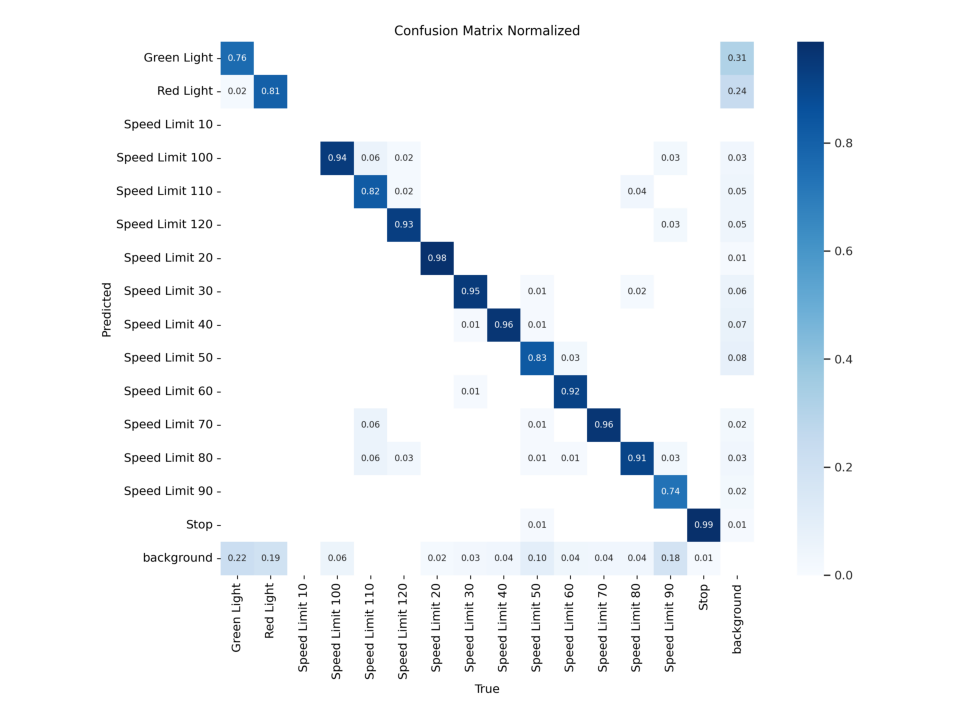

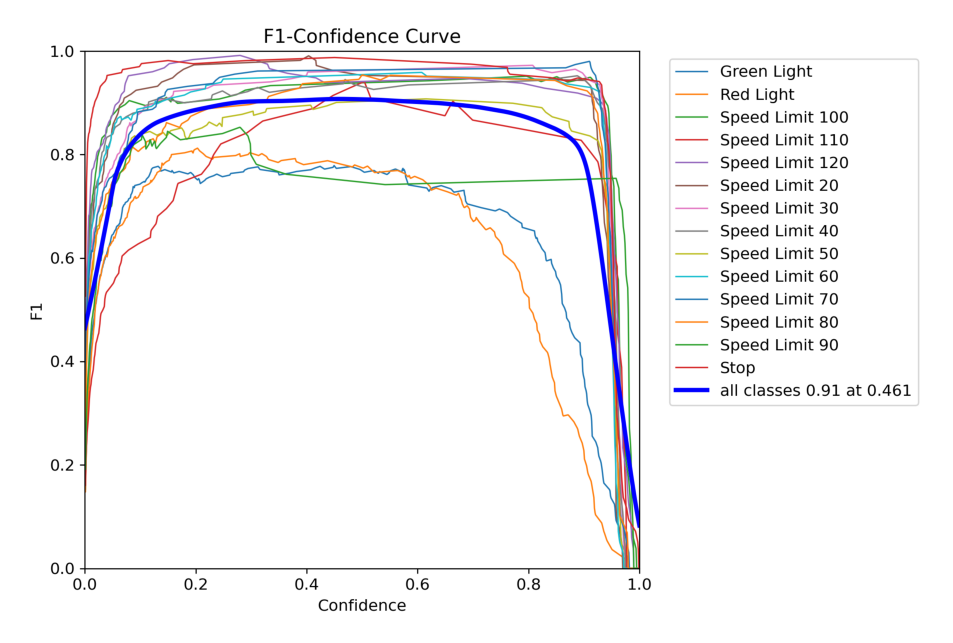

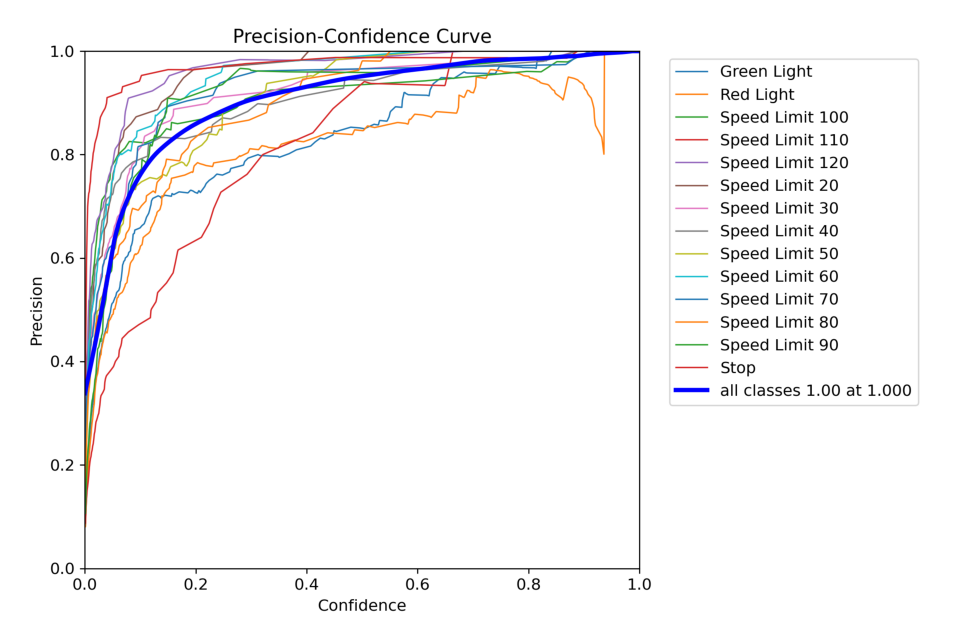

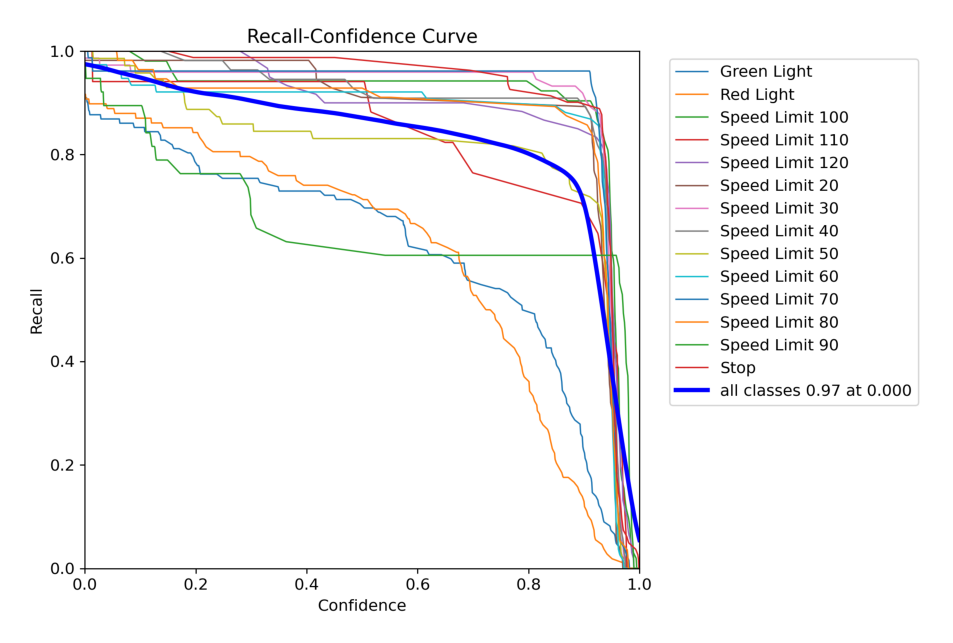

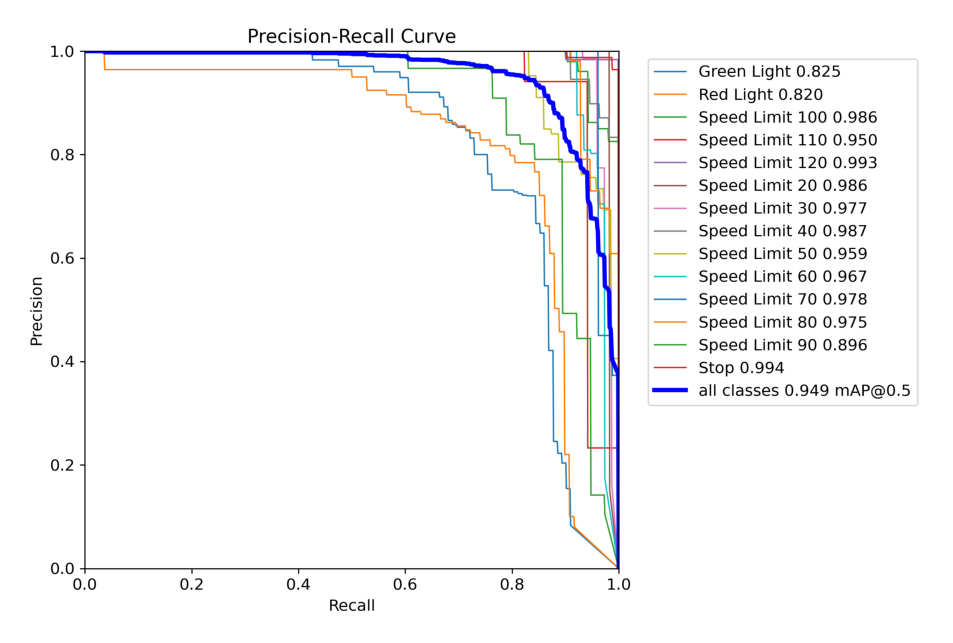

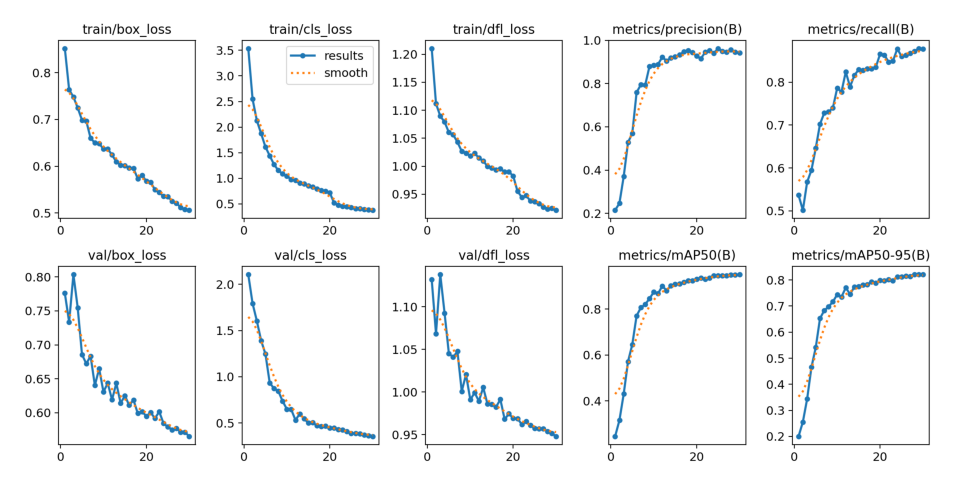

In [16]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]
post_training_files_path = '/content//runs/detect/train4'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:12<00:00,  3.98it/s]


                   all        801        944      0.946      0.879       0.95      0.822
           Green Light         87        122      0.855      0.713      0.836      0.507
             Red Light         74        108       0.84      0.731       0.82      0.495
       Speed Limit 100         52         52      0.933      0.942      0.986      0.886
       Speed Limit 110         17         17        0.9      0.941      0.949      0.882
       Speed Limit 120         60         60      0.984        0.9      0.993      0.903
        Speed Limit 20         56         56          1      0.924      0.986      0.865
        Speed Limit 30         71         74      0.963      0.959      0.977      0.931
        Speed Limit 40         53         55      0.927      0.945      0.987       0.88
        Speed Limit 50         68         71      0.984      0.831      0.959      0.858
        Speed Limit 60         76         76      0.988      0.921      0.967      0.865
        Speed Limit 7

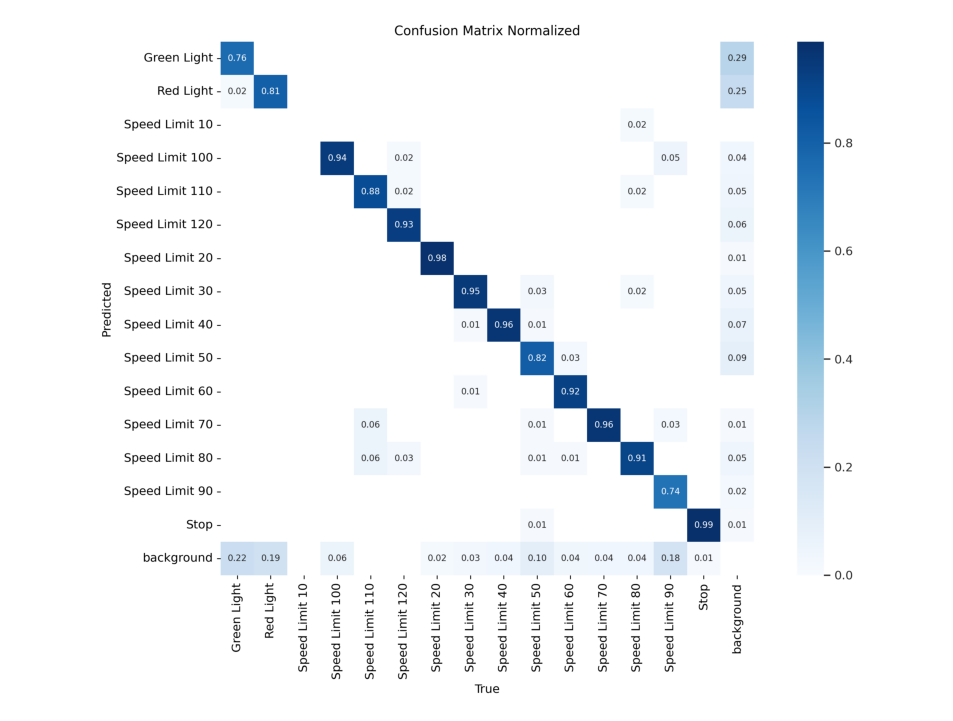

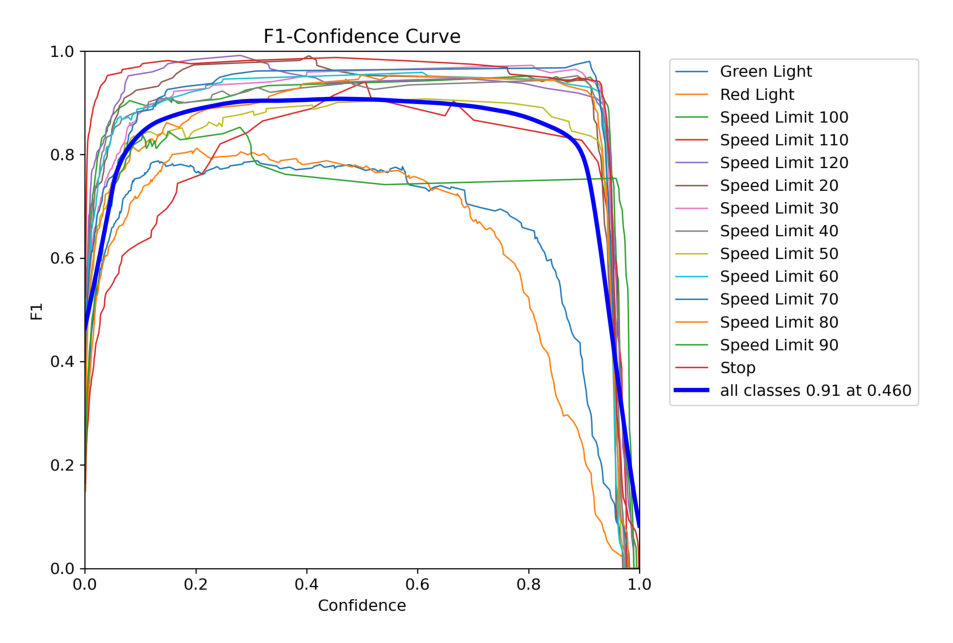

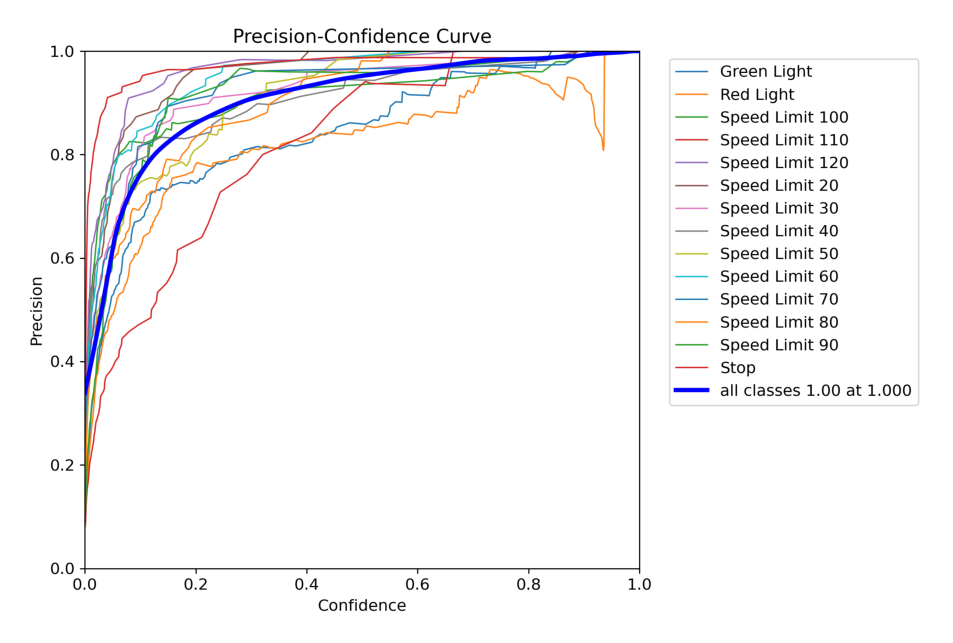

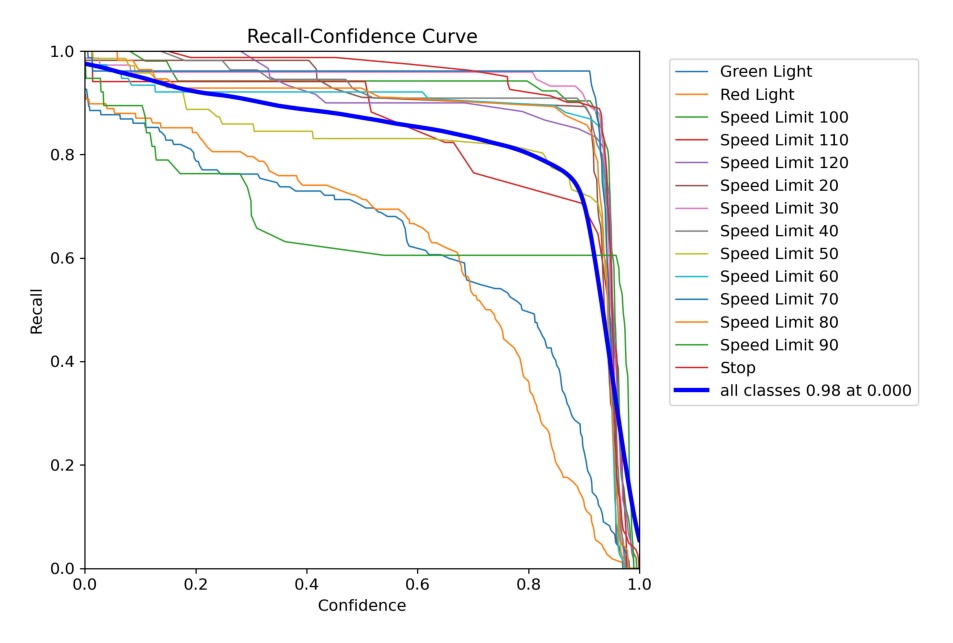

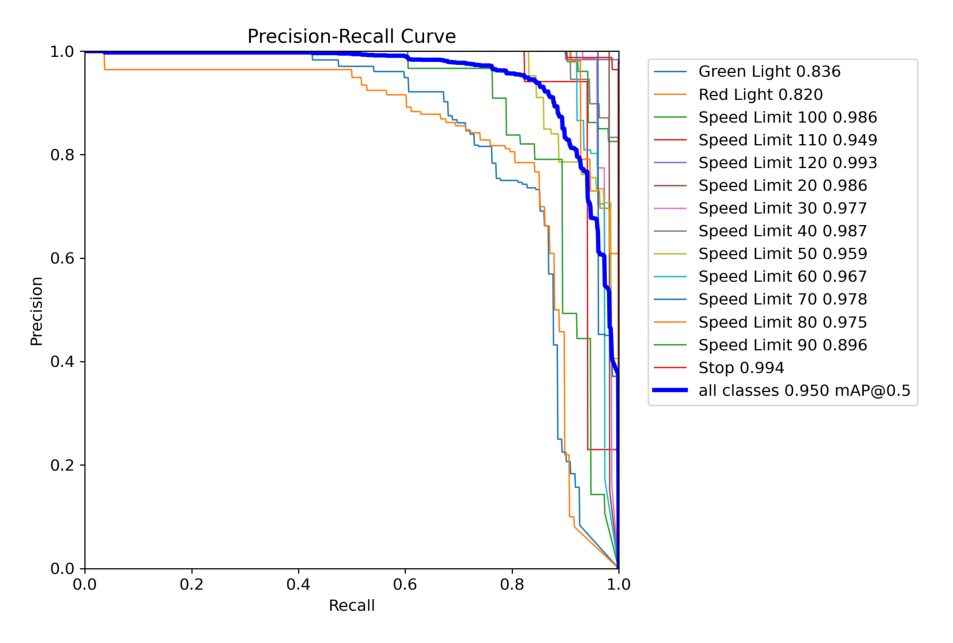

In [18]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',

]
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'))
post_training_files_path = '/content/runs/detect/train42'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/car/test/labels.cache... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.94it/s]


                   all        638        770       0.86      0.841        0.9      0.776
           Green Light         77        110      0.824      0.767      0.862      0.547
             Red Light         71         94      0.778      0.734      0.743      0.463
        Speed Limit 10          2          3      0.482      0.333      0.497      0.377
       Speed Limit 100         45         46      0.916      0.948       0.98      0.864
       Speed Limit 110         21         21      0.902       0.88      0.906      0.832
       Speed Limit 120         40         44      0.932      0.932      0.962      0.873
        Speed Limit 20         46         46      0.978      0.947      0.975      0.879
        Speed Limit 30         60         60      0.897      0.868      0.937      0.869
        Speed Limit 40         51         53       0.88      0.962      0.971      0.855
        Speed Limit 50         47         50      0.689        0.8      0.894      0.816
        Speed Limit 6

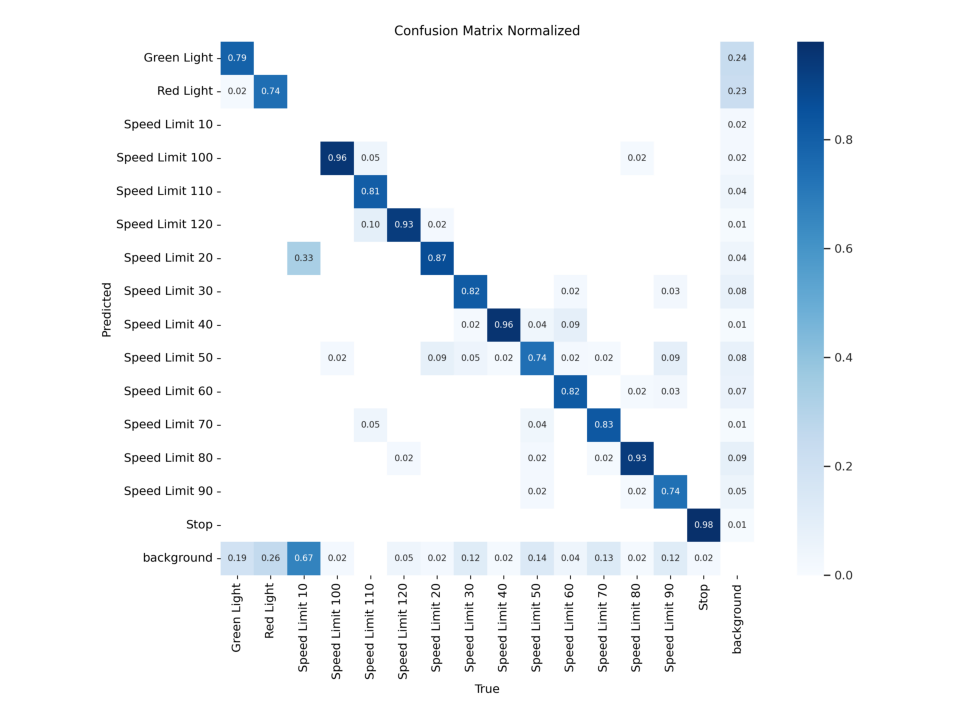

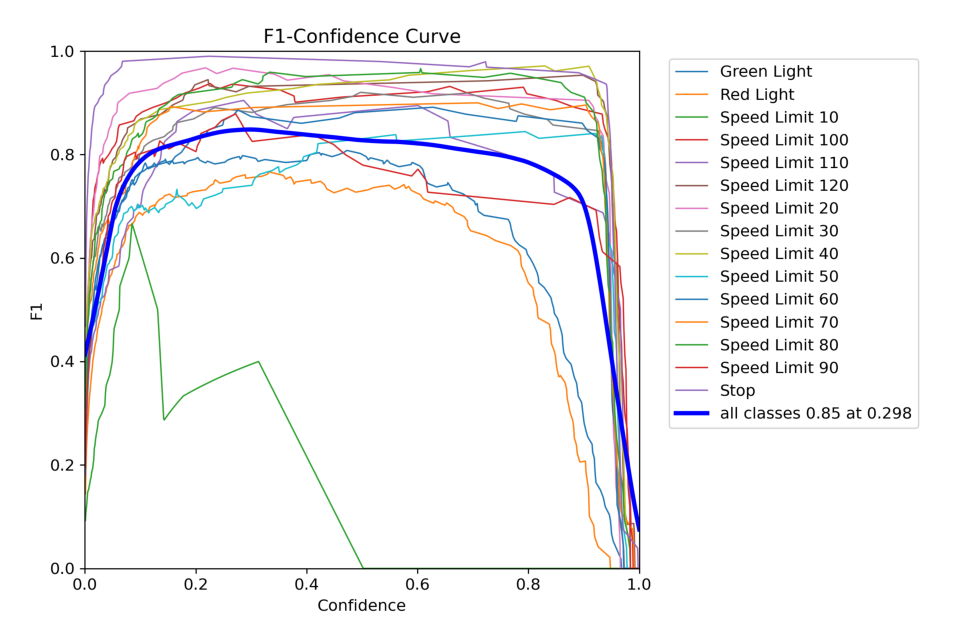

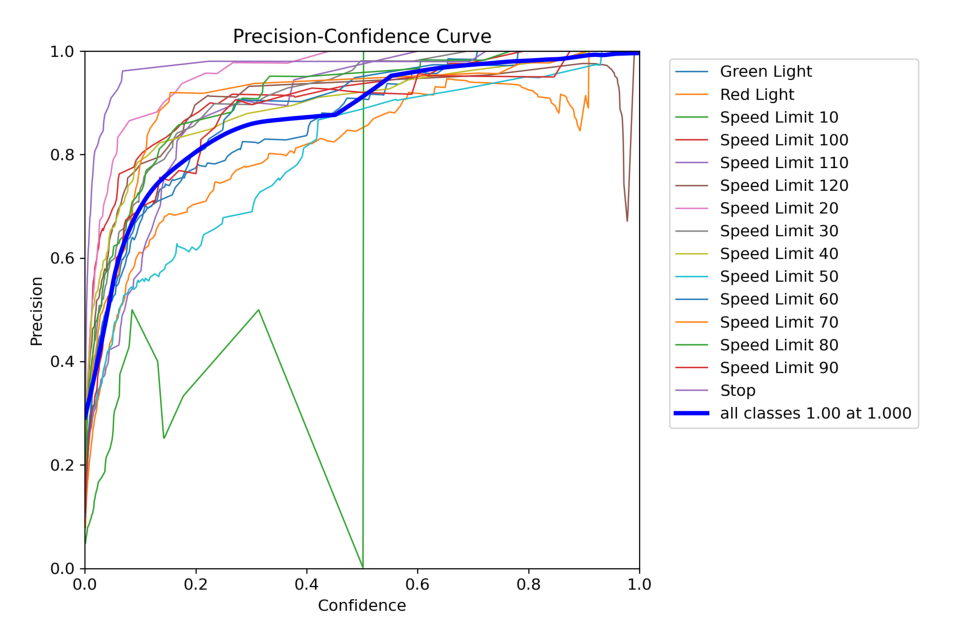

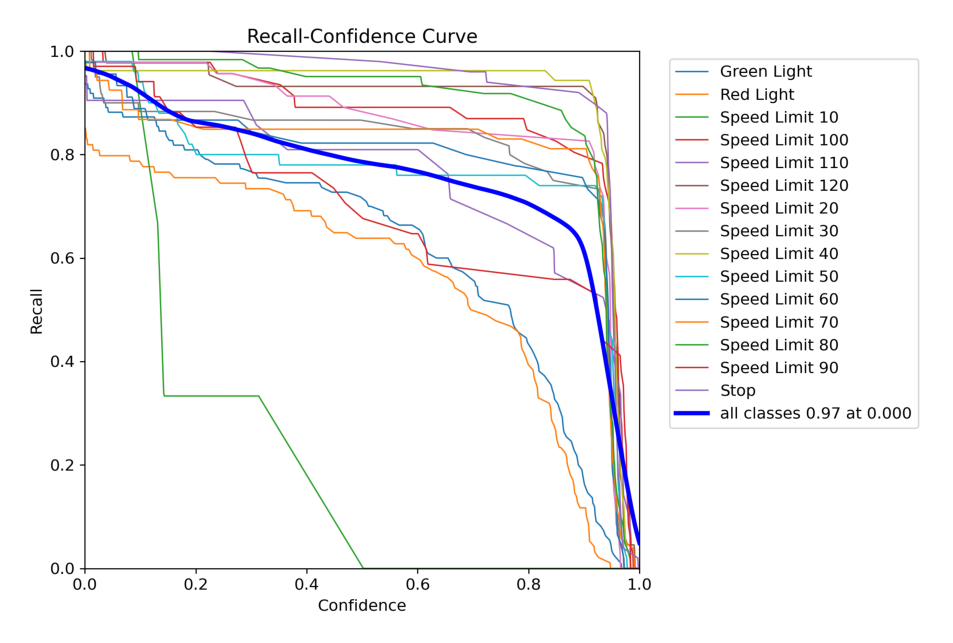

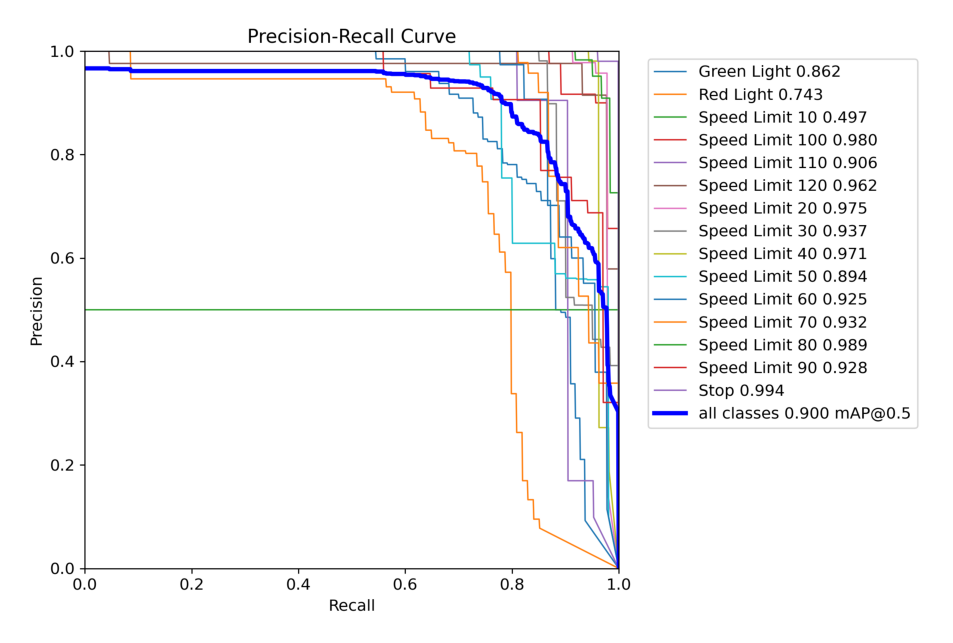

In [19]:
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'test.yaml'))
post_training_files_path = '/content/runs/detect/train43'

display_images(post_training_files_path, image_files)

#### Выводы
- Модель достигла достаточно высокого качества
- Переобучения не наблюдается
- Чаще всего модель путает знак Speed limit 10 с задним фоном на тестовых данных


##### yolov10n.pt

In [20]:
device = 'cuda'
model = YOLO('yolov10n.pt').to(device)

# Training The Final Model
Result_Final_model = model.train(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'),epochs = 30,  )

100%|██████████| 5.59M/5.59M [00:00<00:00, 374MB/s]

engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/content/car/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, s

 23        [16, 19, 22]  1    867178  ultralytics.nn.modules.head.v10Detect        [15, [64, 128, 256]]          
YOLOv10n summary: 223 layers, 2,712,890 parameters, 2,712,874 gradients, 8.4 GFLOPs

Transferred 493/595 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/detect/train5', view at http://localhost:6006/
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅


train: Scanning /content/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      3.07G      1.719      10.81      2.314         33        640: 100%|██████████| 221/221 [01:19<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.69it/s]


                   all        801        944       0.13      0.259      0.172      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      3.23G      1.717      8.239      2.212         25        640: 100%|██████████| 221/221 [01:13<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.04it/s]


                   all        801        944      0.211      0.278      0.207      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      3.23G      1.684      6.438      2.179         22        640: 100%|██████████| 221/221 [01:12<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.40it/s]

                   all        801        944      0.321      0.399      0.311      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      3.23G      1.662      5.172      2.159         27        640: 100%|██████████| 221/221 [01:12<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.66it/s]


                   all        801        944      0.441      0.456       0.43      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      3.23G      1.611      4.149      2.125         25        640: 100%|██████████| 221/221 [01:12<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.07it/s]

                   all        801        944      0.635      0.567      0.594      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      3.23G      1.584       3.52      2.111         22        640: 100%|██████████| 221/221 [01:13<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.22it/s]

                   all        801        944       0.61      0.624      0.636      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      3.23G      1.506       3.11      2.093         30        640: 100%|██████████| 221/221 [01:18<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.22it/s]

                   all        801        944      0.604      0.581      0.638       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      3.23G       1.48       2.84      2.054         26        640: 100%|██████████| 221/221 [01:15<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]

                   all        801        944       0.74      0.666      0.735      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      3.23G      1.493      2.608      2.052         19        640: 100%|██████████| 221/221 [01:15<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.45it/s]


                   all        801        944      0.765       0.67      0.748      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      3.23G      1.469       2.45      2.039         25        640: 100%|██████████| 221/221 [01:17<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.63it/s]


                   all        801        944      0.789      0.675      0.774      0.657

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      3.23G      1.434      2.359      2.042         17        640: 100%|██████████| 221/221 [01:15<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.96it/s]

                   all        801        944      0.743      0.707      0.769      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      3.23G      1.413      2.281      2.023         26        640: 100%|██████████| 221/221 [01:17<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.95it/s]

                   all        801        944      0.837      0.738      0.819      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      3.23G      1.391      2.121       2.01         25        640: 100%|██████████| 221/221 [01:17<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.90it/s]

                   all        801        944      0.828      0.718      0.815        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      3.23G      1.359      2.064      1.994         19        640: 100%|██████████| 221/221 [01:17<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.96it/s]

                   all        801        944      0.795       0.77      0.843      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      3.23G      1.378      2.001      1.993         20        640: 100%|██████████| 221/221 [01:16<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.65it/s]

                   all        801        944      0.822      0.778      0.849      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      3.23G      1.353      1.944      1.975         24        640: 100%|██████████| 221/221 [01:15<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.41it/s]

                   all        801        944      0.831      0.781      0.854      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      3.23G      1.357      1.892      1.981         16        640: 100%|██████████| 221/221 [01:16<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.29it/s]

                   all        801        944      0.856      0.768      0.855      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      3.23G      1.309      1.802      1.968         13        640: 100%|██████████| 221/221 [01:16<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.24it/s]

                   all        801        944      0.885      0.742      0.858      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      3.23G      1.317      1.778      1.973         19        640: 100%|██████████| 221/221 [01:17<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.29it/s]

                   all        801        944      0.894      0.753      0.863      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      3.23G      1.291      1.692      1.955         19        640: 100%|██████████| 221/221 [01:15<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.30it/s]

                   all        801        944       0.87      0.794      0.878      0.752


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      3.23G        1.3      1.346       1.89         12        640: 100%|██████████| 221/221 [01:15<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.26it/s]

                   all        801        944      0.896      0.787      0.887      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      3.23G      1.267      1.228      1.875         19        640: 100%|██████████| 221/221 [01:12<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.98it/s]

                   all        801        944      0.876      0.806      0.891      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      3.23G      1.262      1.168       1.88         11        640: 100%|██████████| 221/221 [01:12<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.33it/s]

                   all        801        944      0.882      0.806      0.891      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      3.23G      1.244      1.141      1.861         10        640: 100%|██████████| 221/221 [01:12<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.74it/s]

                   all        801        944      0.895      0.826      0.909      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      3.23G      1.233      1.093      1.851         12        640: 100%|██████████| 221/221 [01:13<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.83it/s]

                   all        801        944      0.906      0.815      0.904      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      3.23G      1.199      1.054      1.833         10        640: 100%|██████████| 221/221 [01:11<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.15it/s]

                   all        801        944      0.889      0.817      0.905      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      3.23G      1.192      1.022      1.825         15        640: 100%|██████████| 221/221 [01:14<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.69it/s]


                   all        801        944      0.895      0.836      0.921      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      3.23G      1.178      1.002      1.826         10        640: 100%|██████████| 221/221 [01:12<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.63it/s]

                   all        801        944      0.893      0.837      0.918      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      3.23G      1.166     0.9605      1.825         12        640: 100%|██████████| 221/221 [01:14<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  2.97it/s]

                   all        801        944       0.89      0.842      0.922        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      3.23G       1.16     0.9609      1.813         13        640: 100%|██████████| 221/221 [01:13<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.55it/s]


                   all        801        944      0.936      0.819      0.919      0.799

30 epochs completed in 0.707 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 5.8MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 5.8MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 125 layers, 2,700,266 parameters, 0 gradients, 8.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.03it/s]


                   all        801        944      0.887      0.846      0.922        0.8
           Green Light         87        122      0.787      0.604       0.78       0.48
             Red Light         74        108      0.755      0.658      0.771       0.46
       Speed Limit 100         52         52      0.926      0.942      0.966       0.88
       Speed Limit 110         17         17      0.817      0.824      0.892      0.815
       Speed Limit 120         60         60      0.908      0.883      0.957      0.883
        Speed Limit 20         56         56      0.994      0.929      0.976      0.849
        Speed Limit 30         71         74      0.934      0.949      0.979      0.929
        Speed Limit 40         53         55      0.923       0.87      0.965      0.852
        Speed Limit 50         68         71      0.906      0.814      0.928      0.828
        Speed Limit 60         76         76      0.906      0.908      0.949      0.863
        Speed Limit 7

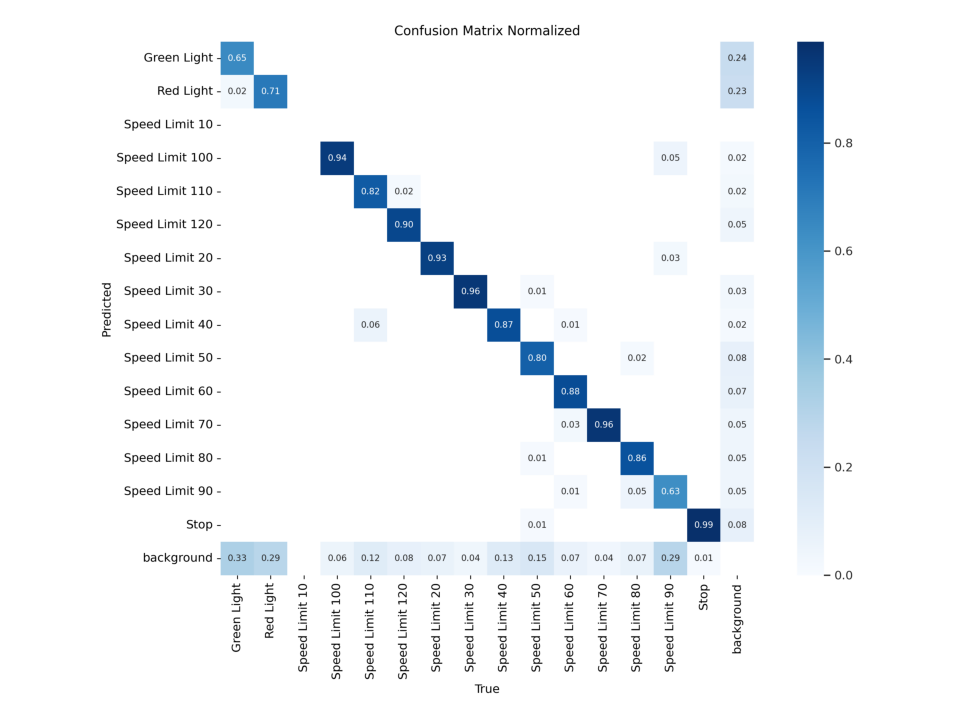

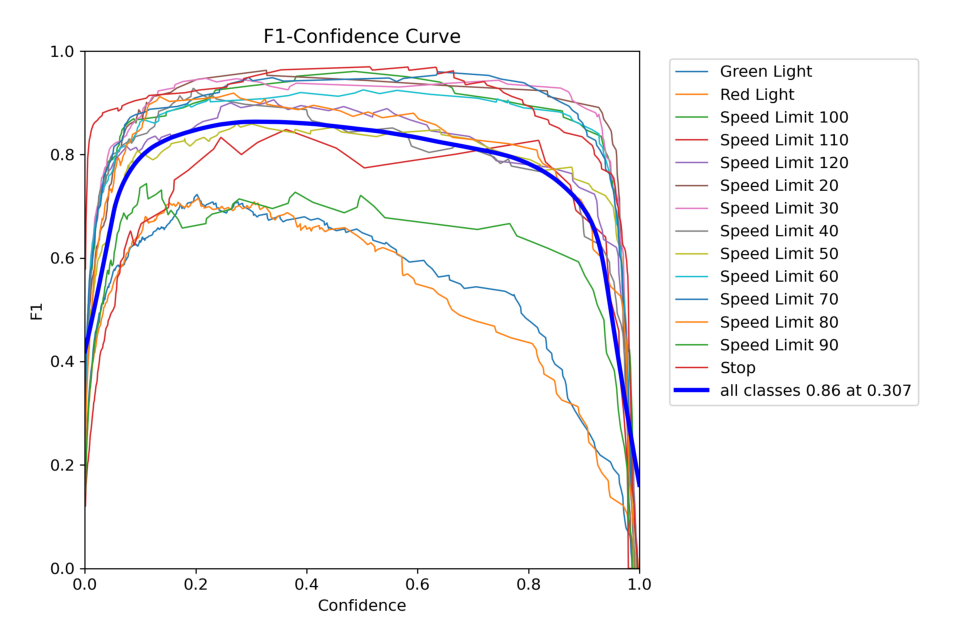

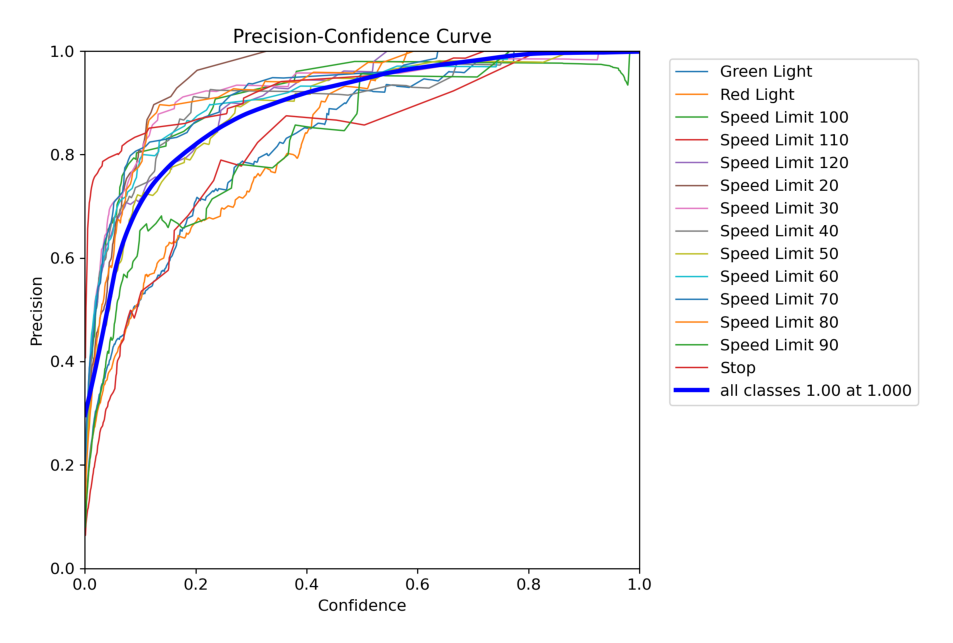

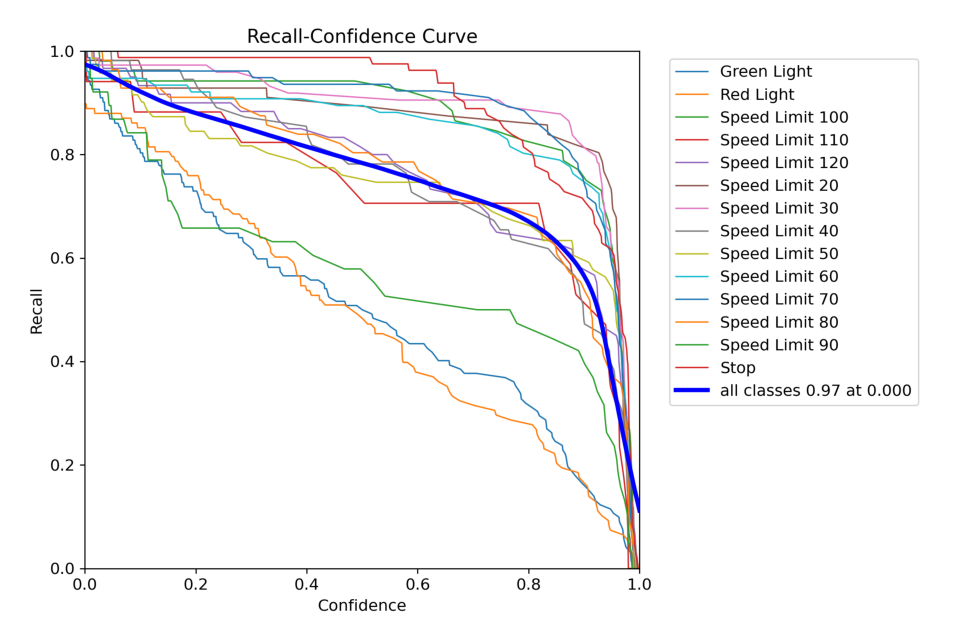

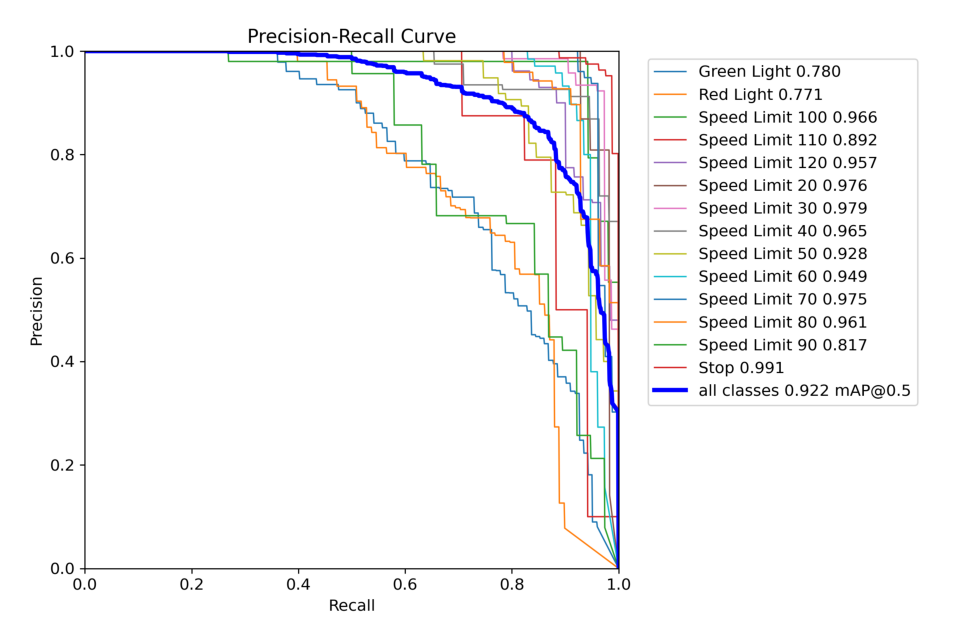

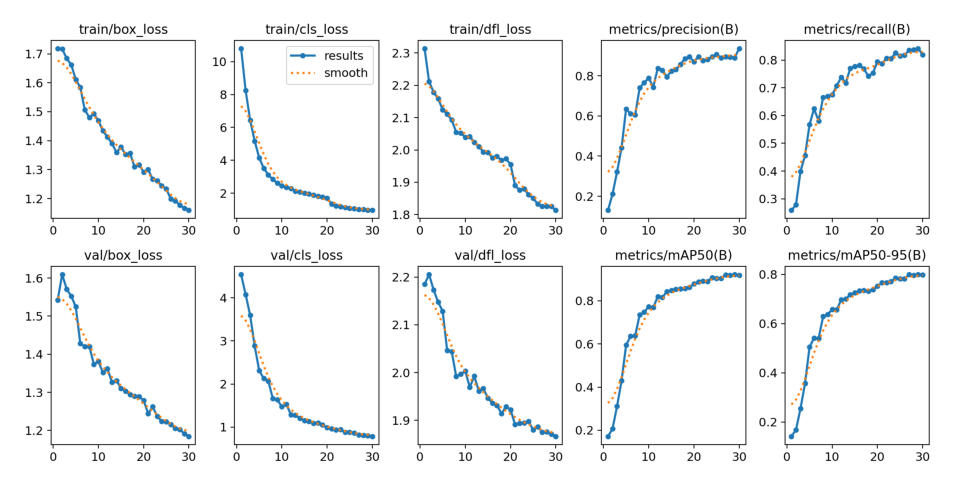

In [21]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]
post_training_files_path = '/content//runs/detect/train5'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 125 layers, 2,700,266 parameters, 0 gradients, 8.3 GFLOPs


val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.73it/s]


                   all        801        944      0.888      0.845      0.923        0.8
           Green Light         87        122      0.785      0.599       0.78      0.478
             Red Light         74        108      0.755      0.657      0.779      0.457
       Speed Limit 100         52         52      0.927      0.942      0.966       0.88
       Speed Limit 110         17         17      0.824      0.824      0.892      0.815
       Speed Limit 120         60         60      0.912      0.883      0.957      0.883
        Speed Limit 20         56         56      0.995      0.929      0.975      0.848
        Speed Limit 30         71         74      0.934      0.949      0.979      0.929
        Speed Limit 40         53         55      0.923      0.869      0.964      0.851
        Speed Limit 50         68         71      0.906       0.81      0.928      0.829
        Speed Limit 60         76         76      0.906      0.908      0.949      0.861
        Speed Limit 7

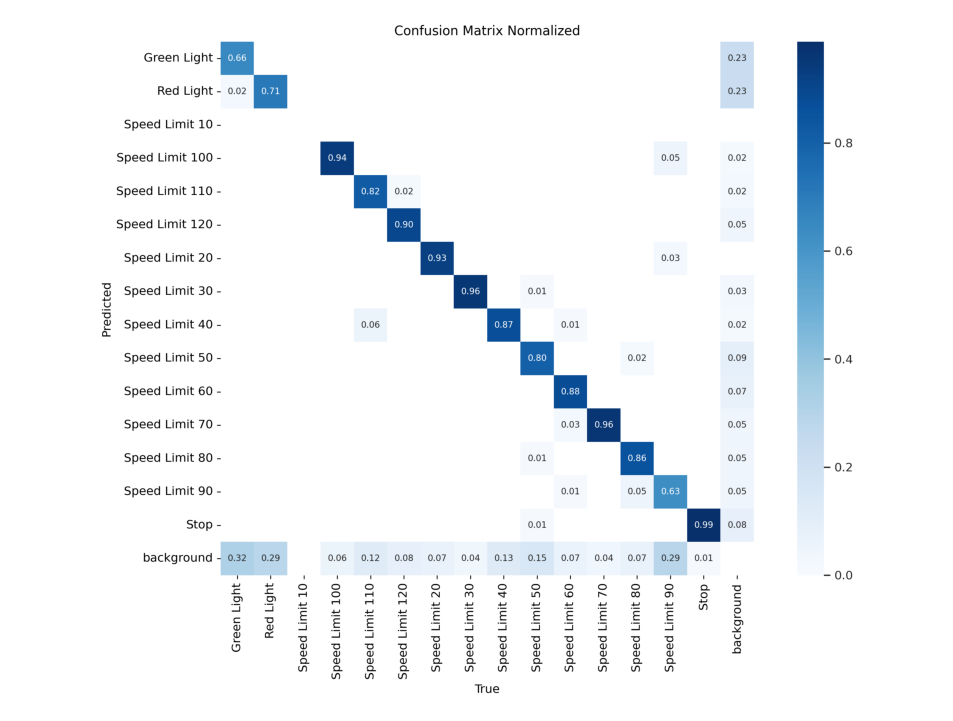

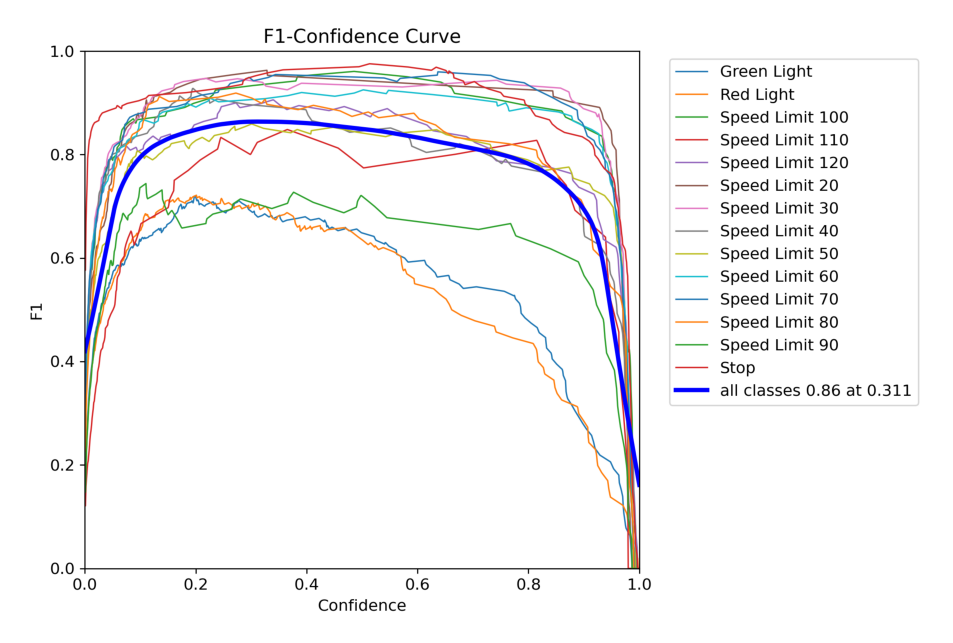

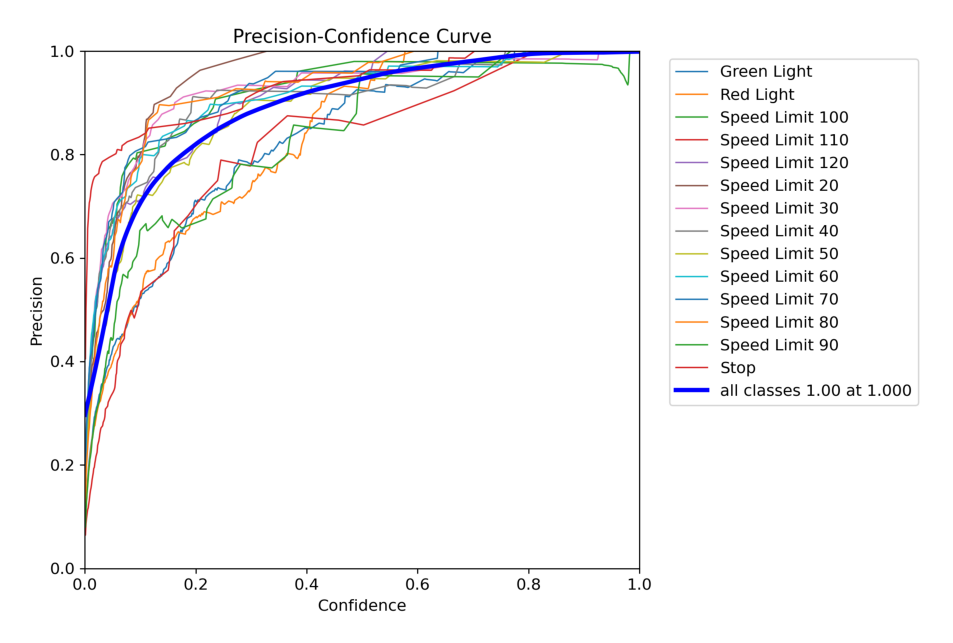

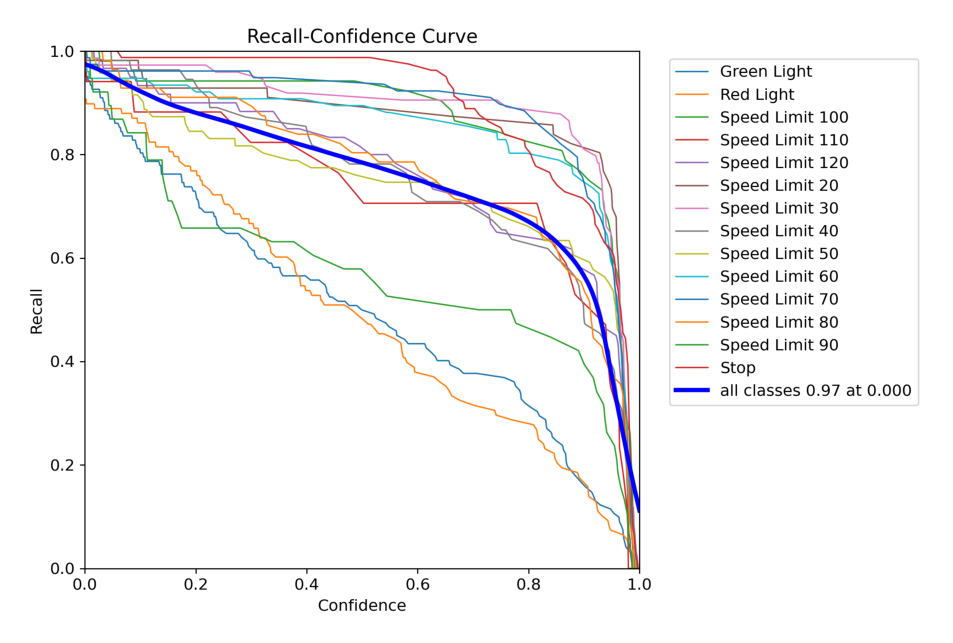

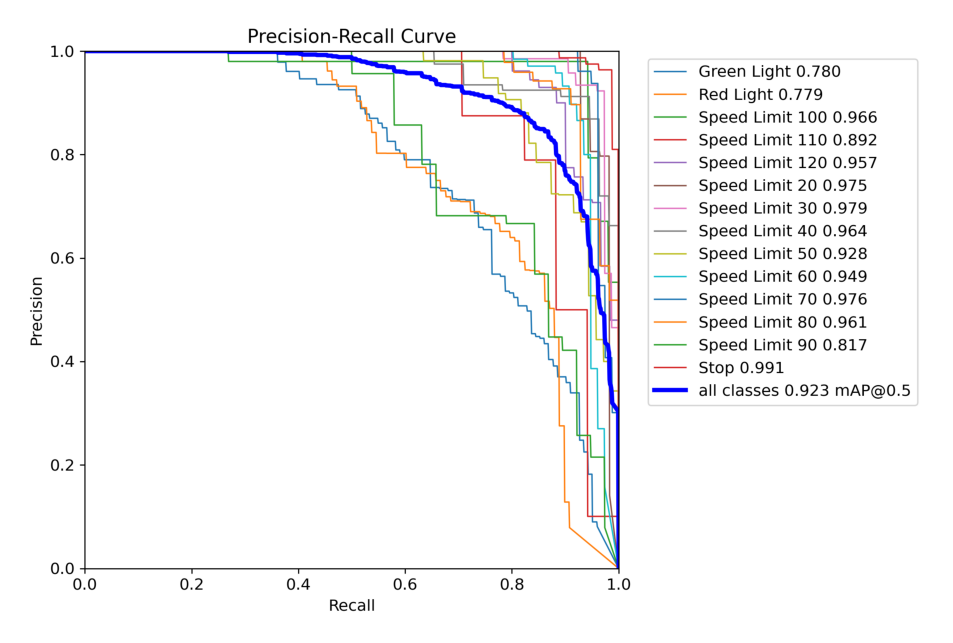

In [22]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',

]
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'))
post_training_files_path = '/content//runs/detect/train52'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/car/test/labels.cache... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:09<00:00,  4.39it/s]


                   all        638        770      0.896      0.739      0.859      0.744
           Green Light         77        110       0.87      0.671      0.804      0.505
             Red Light         71         94      0.842      0.569      0.735      0.452
        Speed Limit 10          2          3          1          0      0.395      0.317
       Speed Limit 100         45         46      0.823      0.826       0.93      0.833
       Speed Limit 110         21         21      0.858      0.667      0.836       0.75
       Speed Limit 120         40         44      0.934      0.955      0.953      0.856
        Speed Limit 20         46         46      0.952      0.863      0.943       0.86
        Speed Limit 30         60         60      0.938      0.833      0.937      0.864
        Speed Limit 40         51         53      0.897      0.943      0.964      0.855
        Speed Limit 50         47         50      0.887       0.72      0.858      0.774
        Speed Limit 6

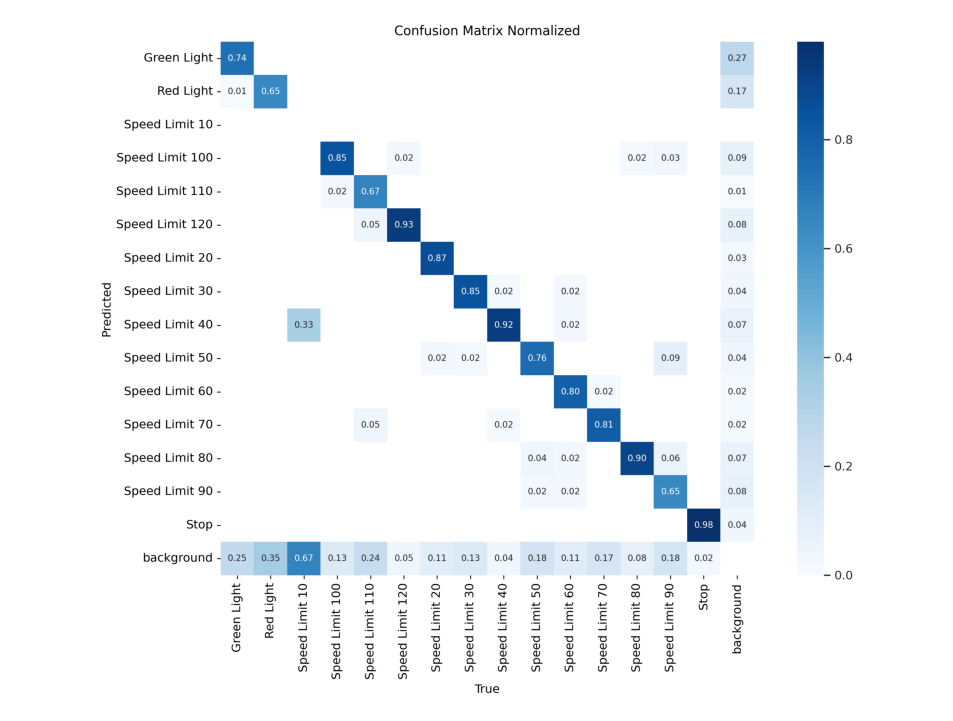

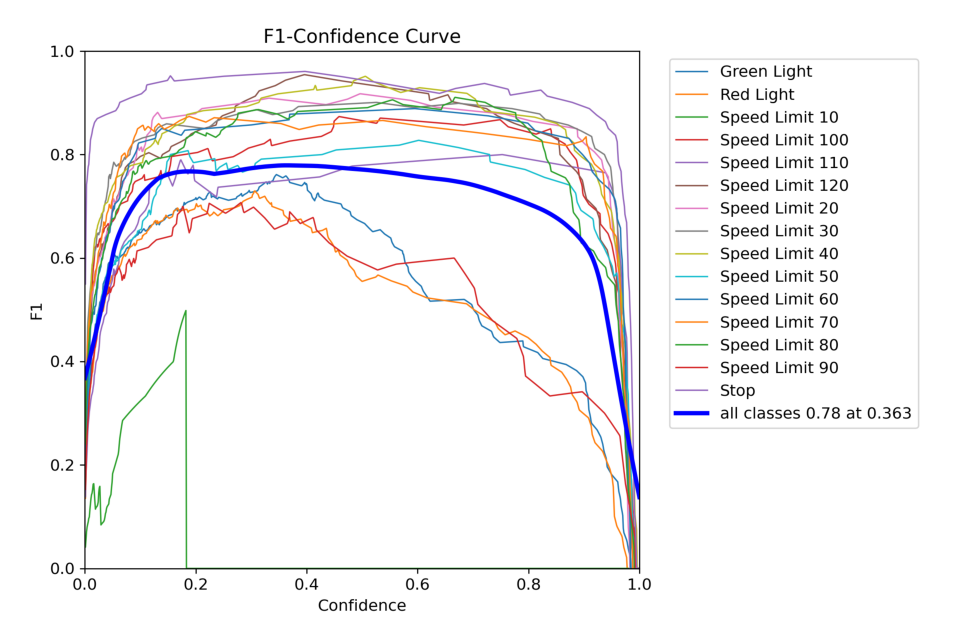

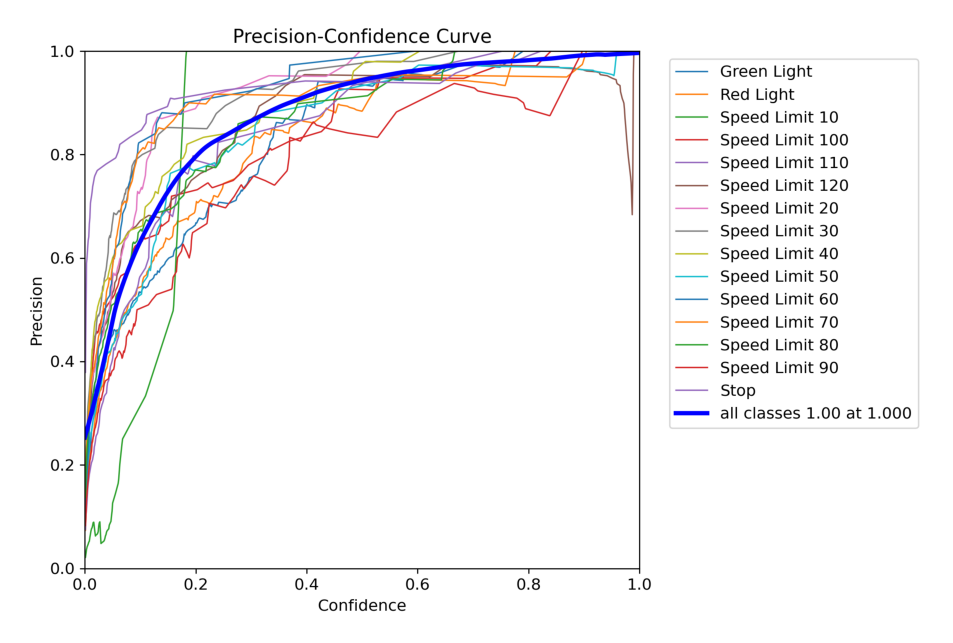

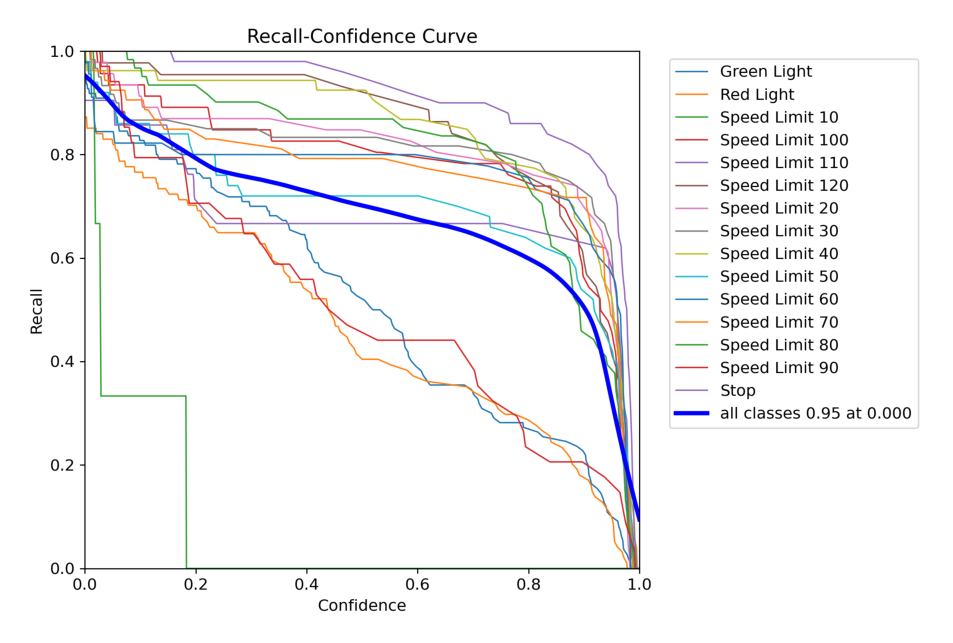

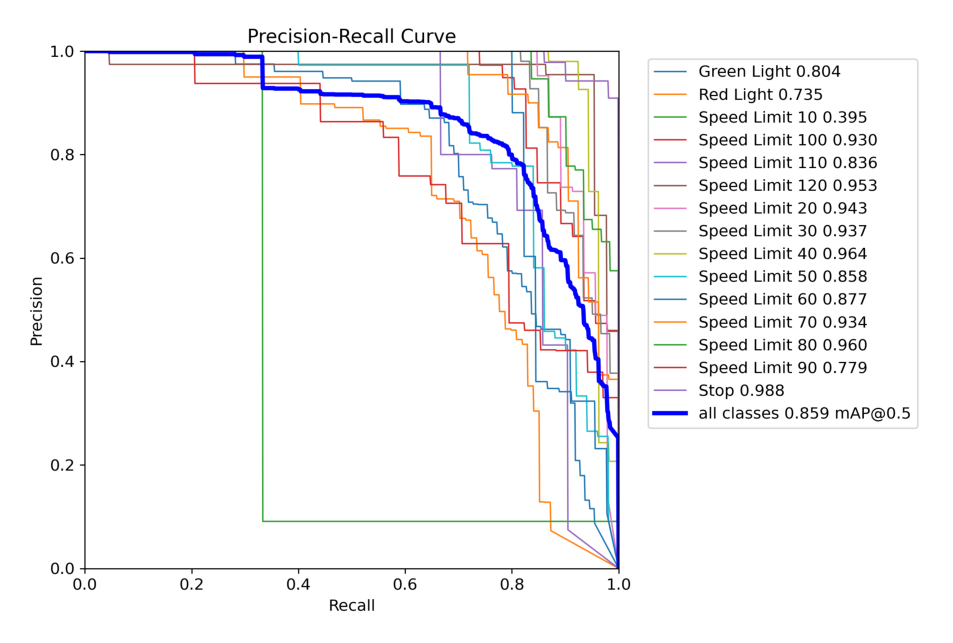

In [23]:
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'test.yaml'))
post_training_files_path = '/content//runs/detect/train53'

display_images(post_training_files_path, image_files)

#### Выводы
- Модель достигла достаточно высокого качества
- Переобучения не наблюдается
- Чаще всего модель путает знак Speed limit 10 с задним фоном на тестовых данных


#### yolo11n.pt

In [24]:
device = 'cuda'
model = YOLO('yolo11n.pt').to(device)

# Training The Final Model
Result_Final_model = model.train(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'),epochs = 30,  )

engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/car/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, si

train: Scanning /content/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.33G      0.857      3.583      1.202         33        640: 100%|██████████| 221/221 [01:21<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.11it/s]


                   all        801        944      0.235      0.411      0.253      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.51G     0.7817       2.63      1.115         25        640: 100%|██████████| 221/221 [01:11<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.19it/s]

                   all        801        944      0.339      0.472      0.364      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.51G      0.738      2.149       1.08         22        640: 100%|██████████| 221/221 [01:09<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.09it/s]

                   all        801        944      0.426      0.519      0.481      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.51G     0.7323      1.857      1.076         27        640: 100%|██████████| 221/221 [01:11<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.34it/s]


                   all        801        944      0.746      0.623      0.682      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.51G     0.7172      1.605      1.062         25        640: 100%|██████████| 221/221 [01:11<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.00it/s]

                   all        801        944      0.765      0.559       0.67      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.51G     0.6994      1.426      1.058         22        640: 100%|██████████| 221/221 [01:10<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.47it/s]


                   all        801        944      0.788      0.693      0.786      0.662

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.51G     0.6674      1.278      1.045         30        640: 100%|██████████| 221/221 [01:09<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.49it/s]

                   all        801        944      0.873      0.733      0.828      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.51G      0.656      1.186      1.029         26        640: 100%|██████████| 221/221 [01:11<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.86it/s]


                   all        801        944      0.806      0.753      0.827      0.696

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.51G     0.6575      1.117      1.026         19        640: 100%|██████████| 221/221 [01:10<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.36it/s]

                   all        801        944      0.902      0.781      0.874      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.52G     0.6379      1.047      1.019         25        640: 100%|██████████| 221/221 [01:09<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.15it/s]

                   all        801        944       0.93      0.787      0.885      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.53G     0.6338     0.9893      1.022         17        640: 100%|██████████| 221/221 [01:08<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.71it/s]


                   all        801        944      0.876      0.807      0.886      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.54G     0.6271     0.9755      1.015         26        640: 100%|██████████| 221/221 [01:09<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.47it/s]

                   all        801        944      0.916      0.814      0.899      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.55G     0.6175     0.9181      1.013         25        640: 100%|██████████| 221/221 [01:12<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.95it/s]


                   all        801        944      0.848      0.816      0.885      0.743

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.55G     0.6025     0.8935      1.001         19        640: 100%|██████████| 221/221 [01:09<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.33it/s]

                   all        801        944      0.917      0.805      0.892       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.55G     0.6082     0.8664     0.9977         20        640: 100%|██████████| 221/221 [01:10<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.11it/s]

                   all        801        944      0.915      0.815      0.896      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.55G     0.6009     0.8396     0.9935         24        640: 100%|██████████| 221/221 [01:10<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.25it/s]

                   all        801        944      0.917      0.846      0.918      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.55G      0.597      0.805     0.9964         16        640: 100%|██████████| 221/221 [01:10<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.97it/s]

                   all        801        944      0.914      0.845      0.917      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.55G     0.5793     0.7813     0.9885         13        640: 100%|██████████| 221/221 [01:11<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.42it/s]

                   all        801        944      0.913       0.86      0.924      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.55G     0.5785     0.7518     0.9889         19        640: 100%|██████████| 221/221 [01:12<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.07it/s]

                   all        801        944      0.946       0.85      0.928      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.55G     0.5686     0.7257      0.981         19        640: 100%|██████████| 221/221 [01:12<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.28it/s]

                   all        801        944      0.946      0.849      0.934      0.805


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.55G      0.571     0.5383     0.9634         12        640: 100%|██████████| 221/221 [01:10<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.13it/s]

                   all        801        944      0.947      0.861      0.936      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.55G     0.5525     0.5004     0.9516         19        640: 100%|██████████| 221/221 [01:08<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.14it/s]

                   all        801        944      0.942      0.871      0.935      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.55G     0.5516     0.4783     0.9531         11        640: 100%|██████████| 221/221 [01:08<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.46it/s]

                   all        801        944      0.949      0.868      0.936      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.55G     0.5416     0.4657     0.9426         10        640: 100%|██████████| 221/221 [01:07<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.28it/s]

                   all        801        944      0.954      0.864      0.939      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.55G     0.5388     0.4492     0.9389         12        640: 100%|██████████| 221/221 [01:07<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.62it/s]

                   all        801        944      0.933       0.87      0.937       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.55G     0.5196     0.4391     0.9305         10        640: 100%|██████████| 221/221 [01:09<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.22it/s]

                   all        801        944      0.957      0.856       0.94      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.55G      0.519     0.4252     0.9265         15        640: 100%|██████████| 221/221 [01:07<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  4.20it/s]

                   all        801        944      0.945      0.867      0.944      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.55G     0.5138     0.4131     0.9252         10        640: 100%|██████████| 221/221 [01:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:06<00:00,  3.83it/s]

                   all        801        944      0.937      0.884      0.948      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.55G      0.507     0.4033     0.9222         12        640: 100%|██████████| 221/221 [01:06<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.37it/s]

                   all        801        944      0.949      0.881      0.948      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.55G     0.5013      0.391     0.9178         13        640: 100%|██████████| 221/221 [01:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.29it/s]

                   all        801        944      0.946      0.885      0.949      0.827



30 epochs completed in 0.650 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 5.5MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.76it/s]


                   all        801        944      0.947      0.885      0.949      0.827
           Green Light         87        122      0.902      0.721      0.845       0.52
             Red Light         74        108      0.886      0.717      0.821      0.512
       Speed Limit 100         52         52      0.903      0.942      0.982      0.884
       Speed Limit 110         17         17      0.792      0.941      0.949      0.896
       Speed Limit 120         60         60          1      0.942      0.994      0.914
        Speed Limit 20         56         56      0.992      0.911      0.982       0.87
        Speed Limit 30         71         74       0.96      0.959      0.984      0.924
        Speed Limit 40         53         55      0.948      0.927      0.985      0.876
        Speed Limit 50         68         71      0.992      0.887      0.961       0.86
        Speed Limit 60         76         76      0.953      0.895      0.952      0.872
        Speed Limit 7

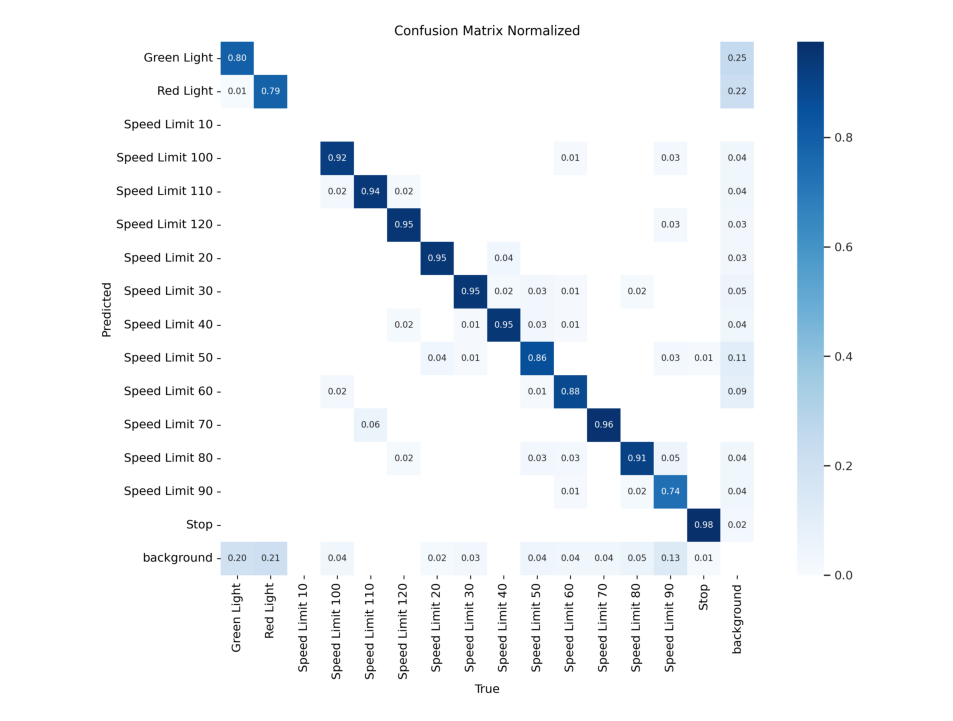

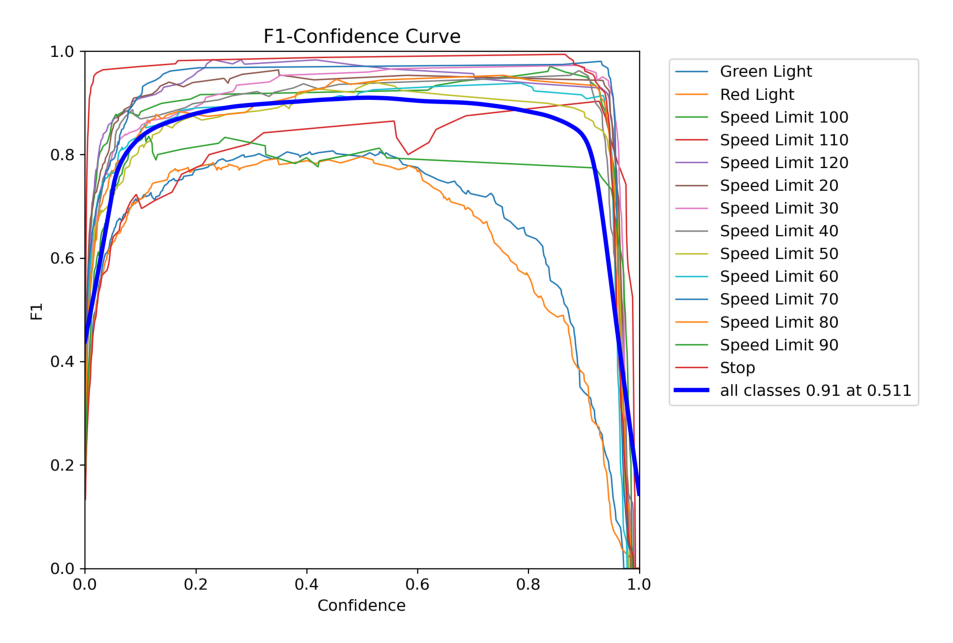

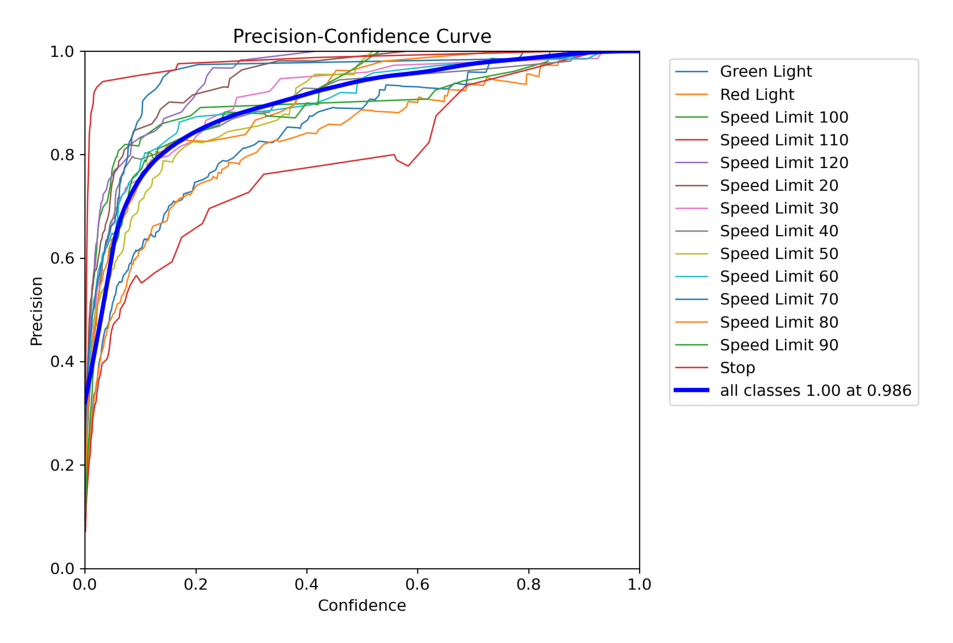

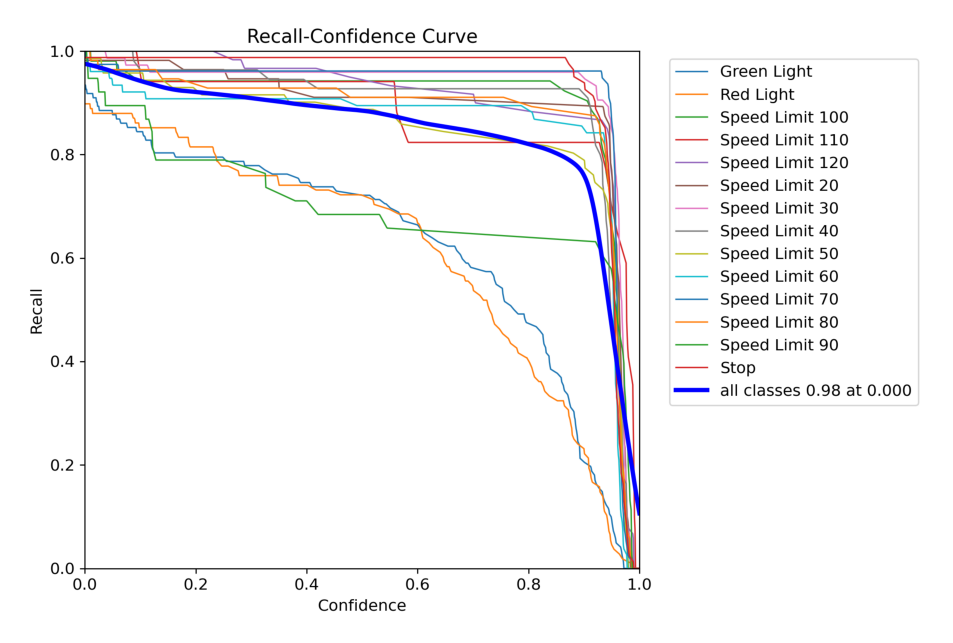

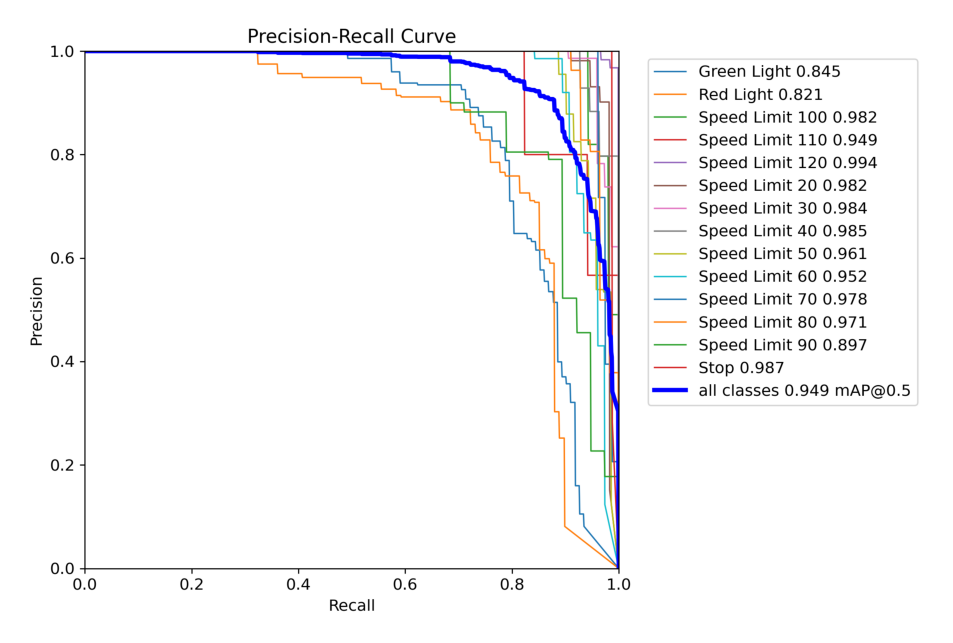

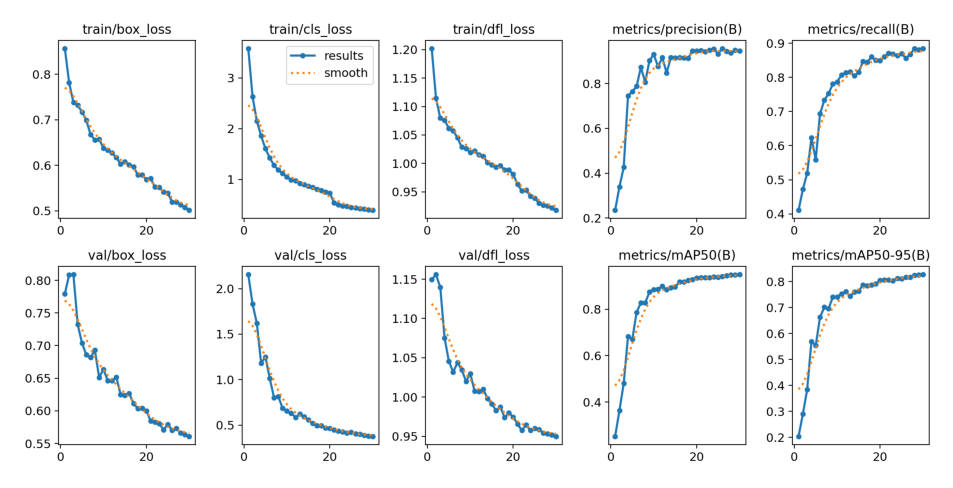

In [25]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]
post_training_files_path = '/content//runs/detect/train6'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.95it/s]


                   all        801        944      0.947      0.885      0.949      0.828
           Green Light         87        122      0.901      0.721      0.838      0.521
             Red Light         74        108      0.886      0.716      0.821      0.514
       Speed Limit 100         52         52      0.903      0.942      0.982      0.888
       Speed Limit 110         17         17      0.792      0.941      0.949      0.896
       Speed Limit 120         60         60          1      0.942      0.994      0.918
        Speed Limit 20         56         56      0.992      0.911      0.982      0.871
        Speed Limit 30         71         74       0.96      0.959      0.984      0.923
        Speed Limit 40         53         55      0.949      0.927      0.985      0.876
        Speed Limit 50         68         71      0.992      0.887      0.961      0.859
        Speed Limit 60         76         76      0.953      0.895      0.952       0.87
        Speed Limit 7

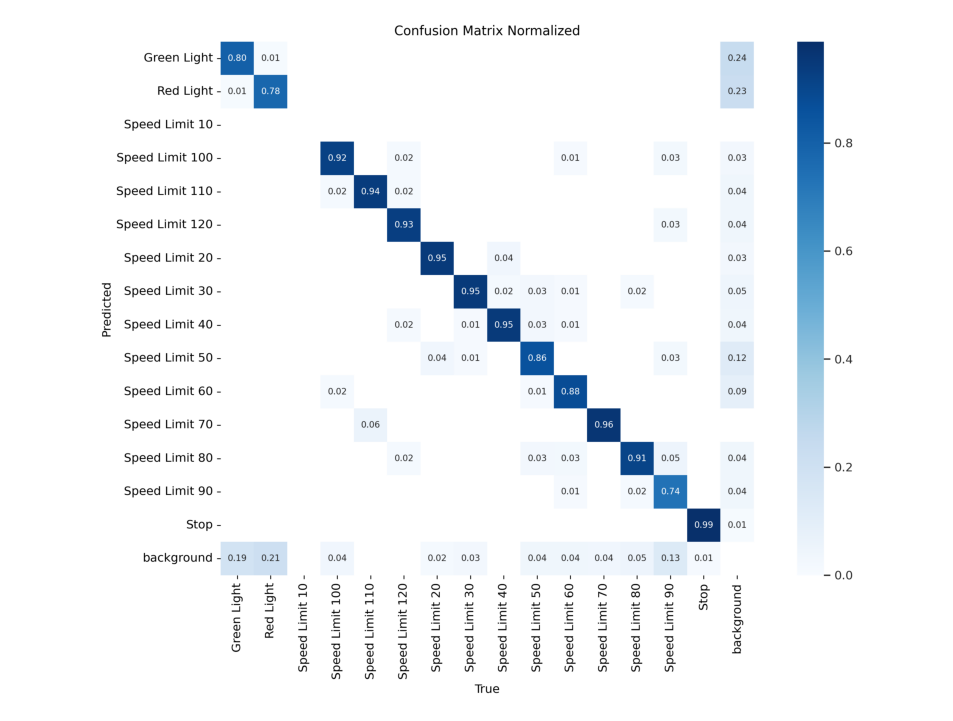

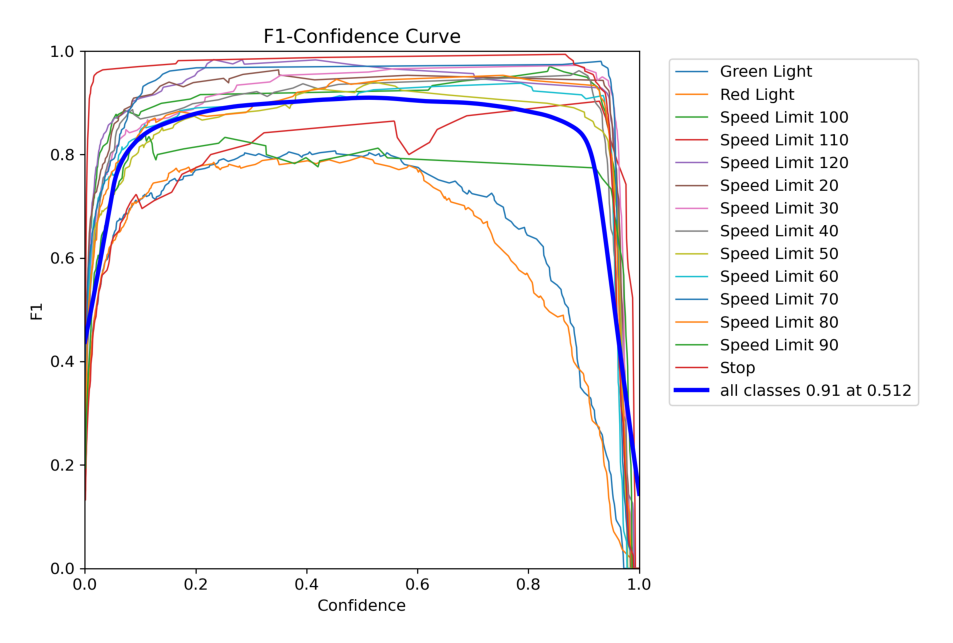

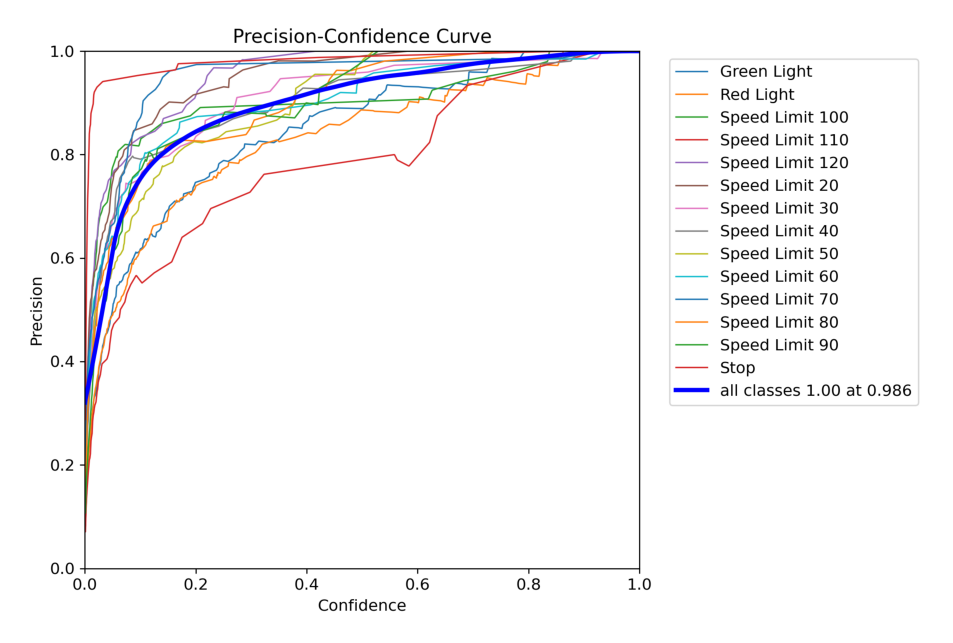

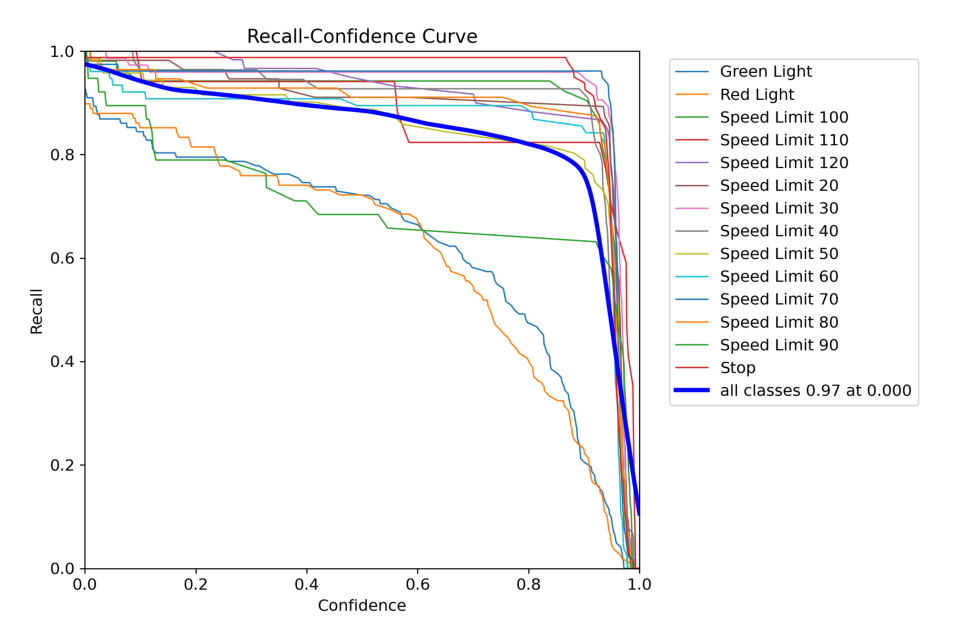

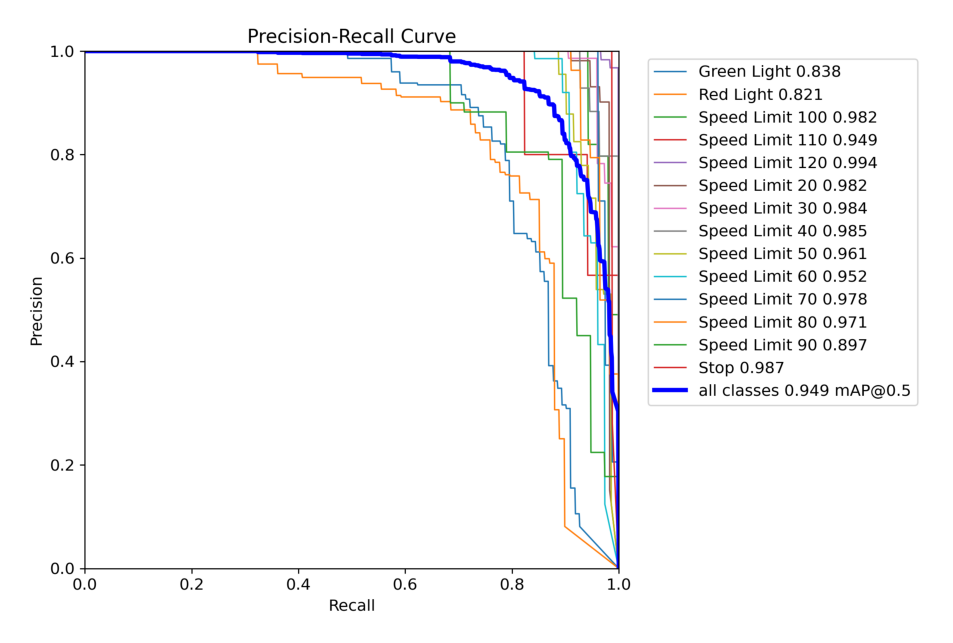

In [26]:
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',

]
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'data.yaml'))
post_training_files_path = '/content//runs/detect/train62'

display_images(post_training_files_path, image_files)

Ultralytics 8.3.107 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/car/test/labels.cache... 638 images, 1 backgrounds, 0 corrupt: 100%|██████████| 638/638 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:07<00:00,  5.38it/s]


                   all        638        770      0.887      0.851      0.916      0.789
           Green Light         77        110      0.847      0.845      0.889      0.554
             Red Light         71         94      0.783      0.728       0.76      0.482
        Speed Limit 10          2          3          1      0.566       0.71      0.598
       Speed Limit 100         45         46      0.945      0.913       0.98      0.852
       Speed Limit 110         21         21      0.943      0.714      0.861      0.765
       Speed Limit 120         40         44      0.863      0.977      0.957      0.856
        Speed Limit 20         46         46      0.934      0.927      0.971      0.881
        Speed Limit 30         60         60       0.84       0.85       0.93      0.858
        Speed Limit 40         51         53       0.86      0.962      0.984      0.883
        Speed Limit 50         47         50      0.826        0.9      0.935      0.844
        Speed Limit 6

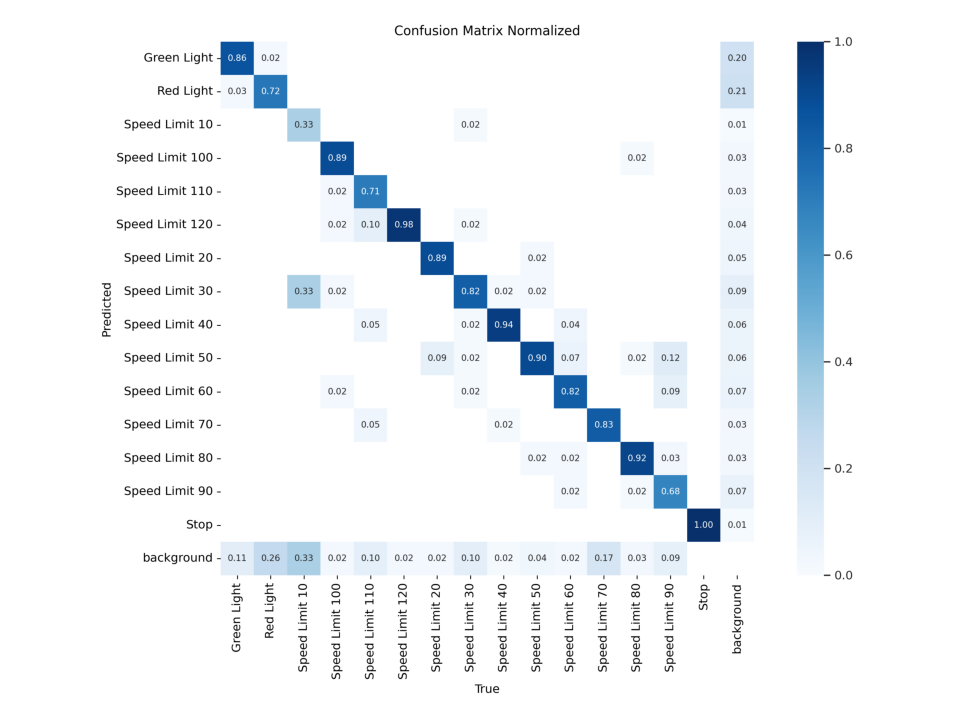

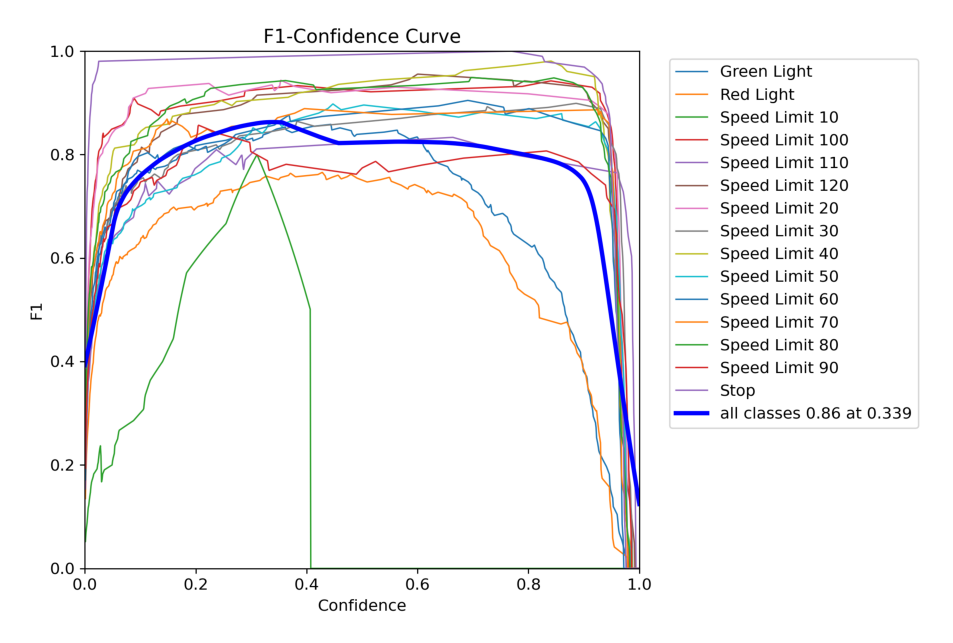

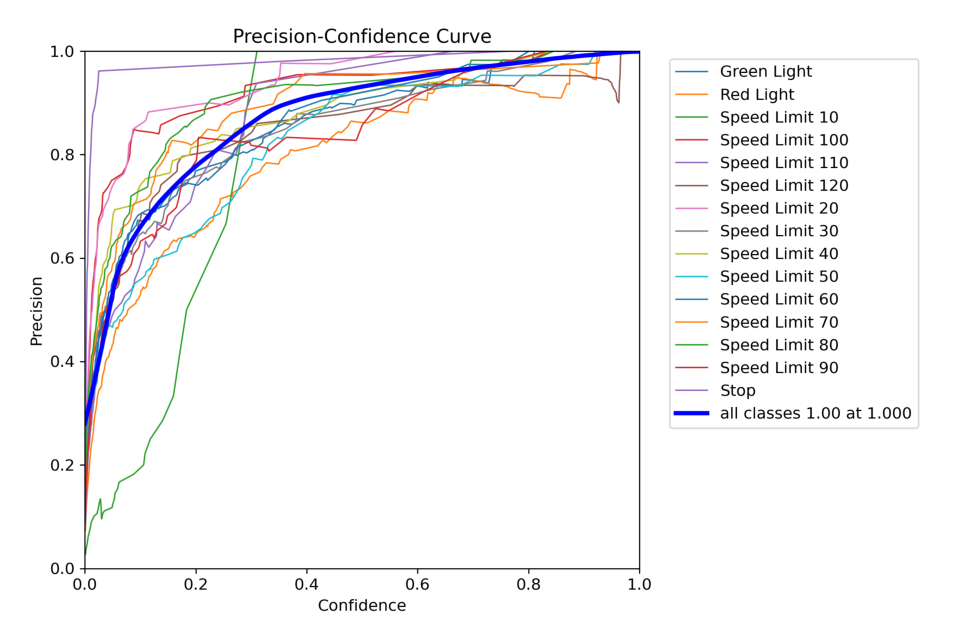

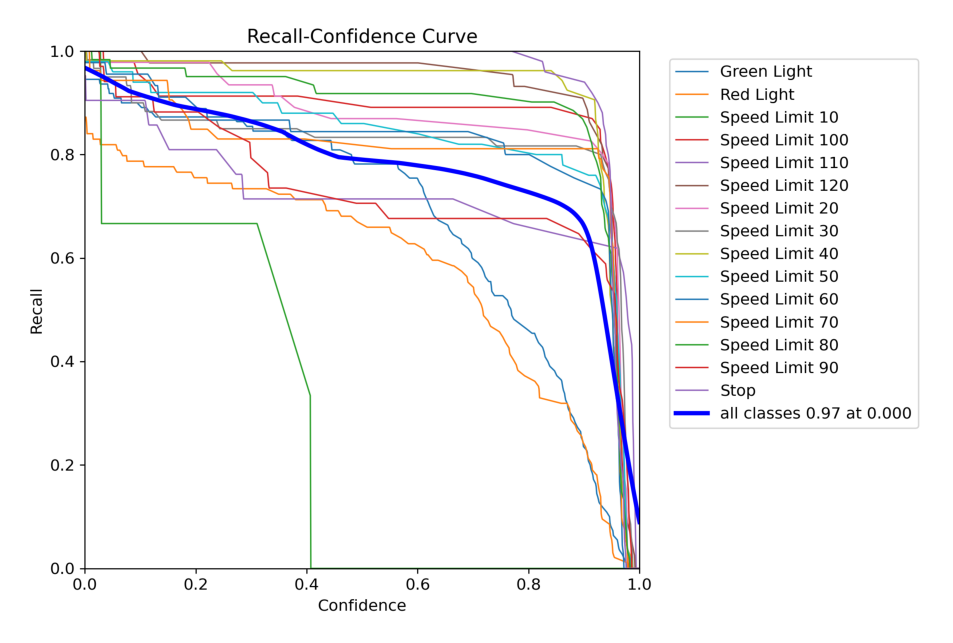

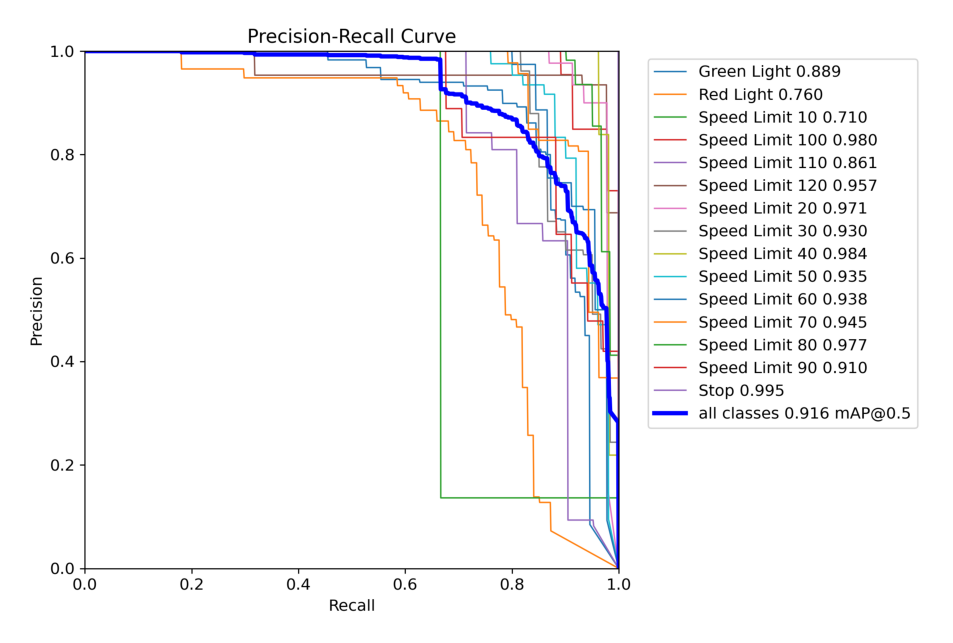

In [27]:
model.val(data=os.path.join(os.path.join(os.getcwd(),'car'),'test.yaml'))
post_training_files_path = '/content//runs/detect/train63'

display_images(post_training_files_path, image_files)

#### Выводы
- Модель достигла достаточно высокого качества
- Переобучения не наблюдается
- Чаще всего модель путает знак Speed limit 10 с Speed limit 30 и задним фоном


#### Общие выводы
- yolo11n.pt показала лучшее качество
- Переобучения у всех моделей не наблюдается
- У всех модели наблюдаются проблемы с знаком Speed limit 10